In [25]:
import matplotlib.pyplot as plt
import neurokit2 as nk
import numpy as np
import os
import pandas as pd
import pywt
from collections import defaultdict
from dataclasses import dataclass, field
from scipy.signal import butter, filtfilt, find_peaks
from sklearn.preprocessing import LabelEncoder

DATA_DIR = "./data" 
SIGNAL = "MLII"
RECORD_ID = '100'
SEQUENCE_LENGTH = 360
WINDOW_BEFORE_R = 180
WINDOW_AFTER_R = 180 

TARGET_CLASSES = {
    'N': 0, 'L': 1, 'R': 2, 'A': 3, 'V': 4
}

# AAMI standard groups: 
# N: Normal, L: LBBB, R: RBBB, A: APB, V: PVC
CLASS_MAP = {
    'N': 'N', 'L': 'L', 'R': 'R', 'A': 'A', 'V': 'V',
    # Map other minor classes to their AAMI standard (for simplicity)
    'J': 'N', 'e': 'N', 'j': 'N', 'Q': 'N',  # N-like beats
    '/': 'N',  # Paced
    'E': 'V',  # Ventricular escape beat
    'F': 'V',  # Fusion of Ventricular and Normal
    'S': 'A',  # Supraventricular (Non-N)
    '!': 'A',  # Atrial flutter/fibrillation
    '[': 'N', ']': 'N',  # Beat onset/offset markers
}

In [7]:
@dataclass
class EkgRecord:
    signal: pd.DataFrame = field(default=None) 
    annotations: pd.DataFrame = field(default_factory=lambda: pd.DataFrame()) 

def read_ekg_file(file_path):
    data = pd.read_csv(file_path)
    if SIGNAL in data.columns:
        return data
    else:
        file_name = file_path.split(os.path.sep)[-1]
        skipped_files.append(file_name)
        return None

def read_annotation_file(file_path):
    data = pd.read_csv(file_path)
    return data

ekg_records = defaultdict(EkgRecord)
file_list = os.listdir(DATA_DIR)
skipped_files = []

print(f"Processing {len(file_list)} files in {DATA_DIR} ...")

for file_name in file_list:
    if not file_name.endswith('.csv') or file_name == 'annotation_symbols.csv':
        continue

    file_path = os.path.join(DATA_DIR, file_name)

    ekg_number = file_name.split('_')[0]
    record = ekg_records[ekg_number]

    if '_ekg.csv' in file_name:
        signal_data = read_ekg_file(file_path)
        if signal_data is not None:
            record.signal = signal_data
        else:
            skipped_files.append(file_name)
    
    elif '_annotations_' in file_name:
        annotation_data = read_annotation_file(file_path)
        if annotation_data is not None:
            record.annotations = pd.concat([record.annotations, annotation_data], ignore_index=True)

for file_name in skipped_files:
    ekg_number = file_name.split('_')[0]
    if ekg_number in ekg_records:
        del ekg_records[ekg_number]


Processing 202 files in ./data ...


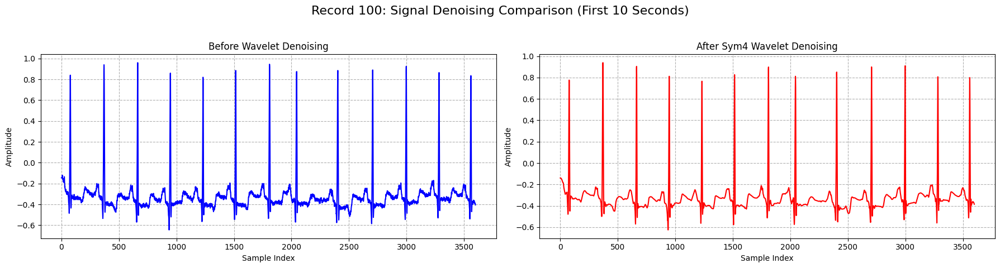

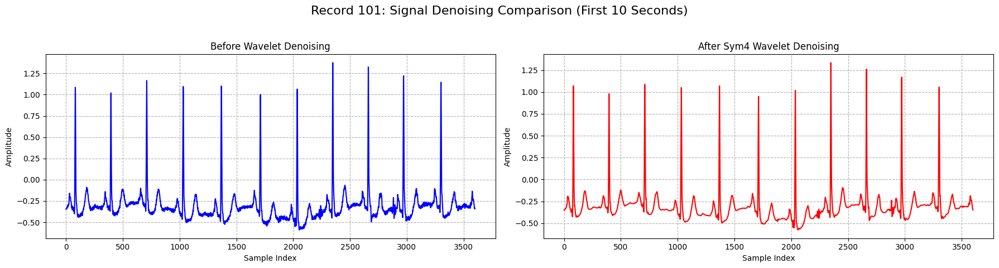

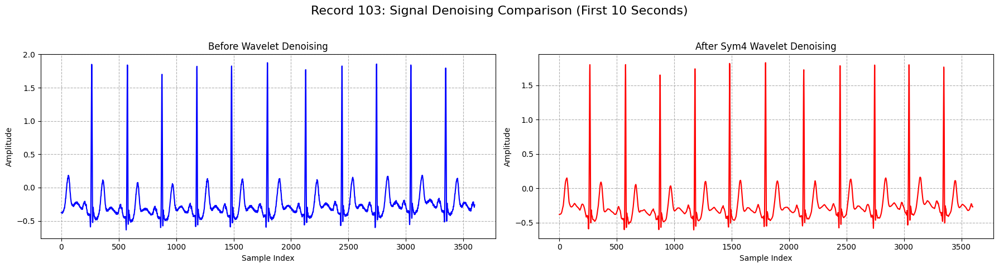

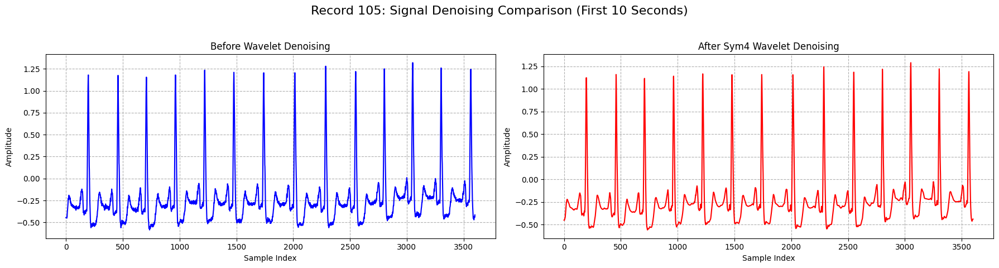

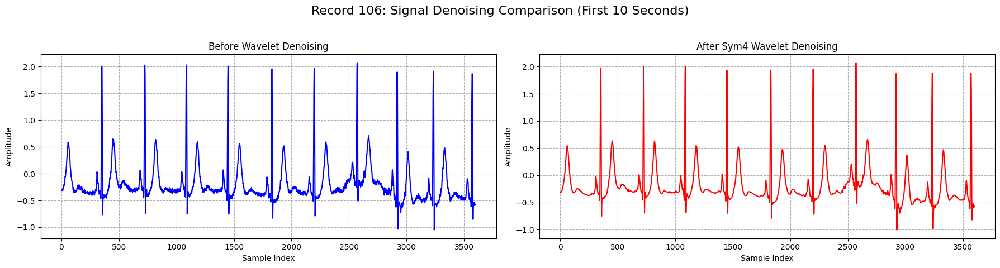

...

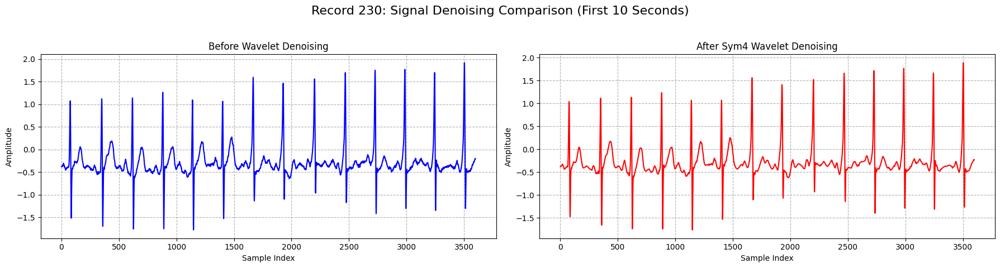

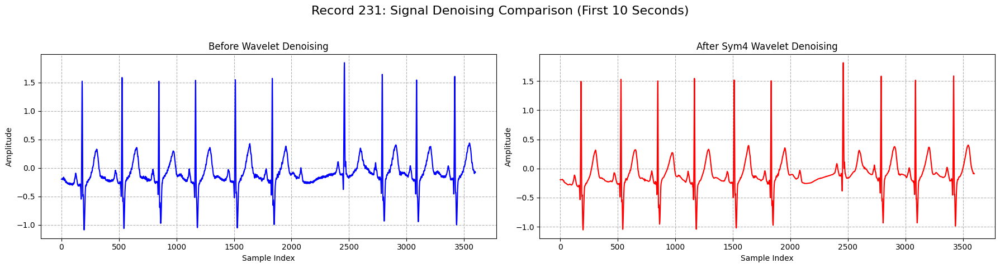

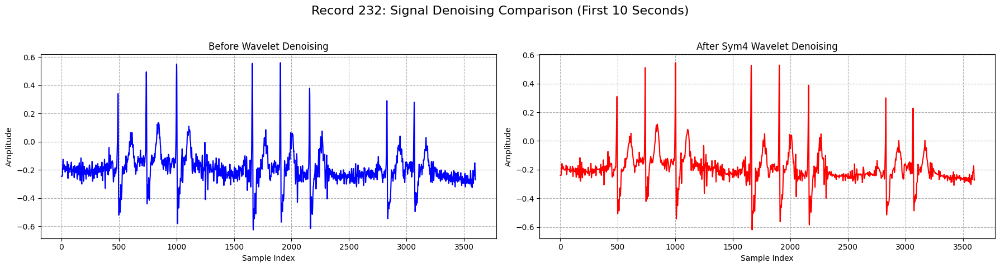

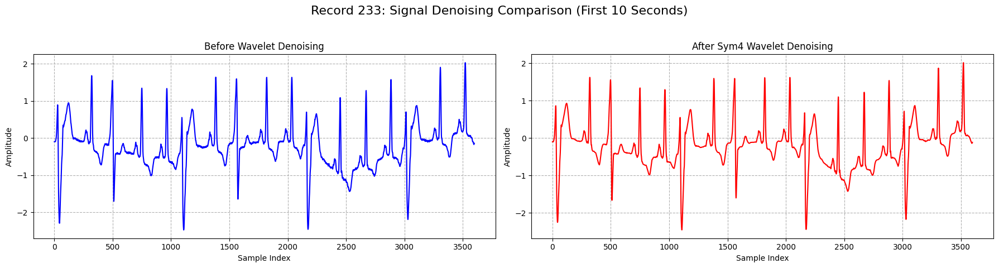

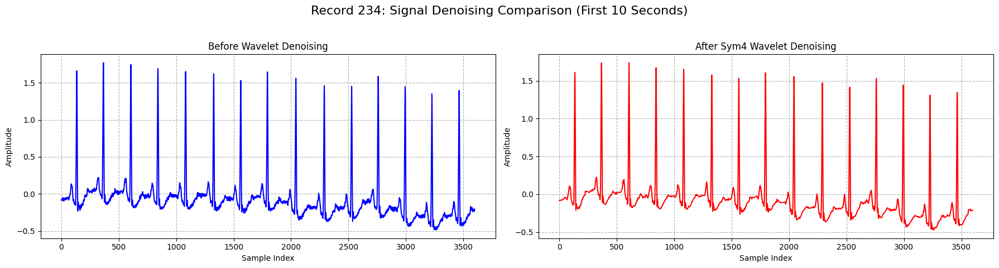

In [ ]:
denoised_ekgs = {}

def load_and_denoise_signal(ekg, ekg_info):
    """Loads signal data and applies Sym4 Wavelet Denoising."""
    
    signal = ekg_info.signal[SIGNAL].values
    
    # wavelet Denoising (Sym4)
    wavelet = 'sym4'
    level = pywt.dwt_max_level(len(signal), wavelet)
    
    coeffs = pywt.wavedec(signal, wavelet, level=level)
    
    sigma = np.median(np.abs(coeffs[-1])) / 0.6745 
    threshold = sigma * np.sqrt(2 * np.log(len(signal))) 
    
    denoised_coeffs = [coeffs[0]] + [pywt.threshold(c, threshold, mode='soft') for c in coeffs[1:]]
    
    denoised_signal = pywt.waverec(denoised_coeffs, wavelet)
    
    denoised_signal = denoised_signal[:len(signal)] 

    PLOT_SAMPLES = 3600 

    fig, axes = plt.subplots(1, 2, figsize=(18, 5))
    fig.suptitle(f'Record {ekg}: Signal Denoising Comparison (First 10 Seconds)', fontsize=16)

    # original signal
    axes[0].plot(signal[:PLOT_SAMPLES], label='Original Signal', color='blue')
    axes[0].set_title('Before Wavelet Denoising')
    axes[0].set_xlabel('Sample Index')
    axes[0].set_ylabel('Amplitude')
    axes[0].grid(True, linestyle='--')
    
    # denoised signal
    axes[1].plot(denoised_signal[:PLOT_SAMPLES], label='Denoised Signal', color='red')
    axes[1].set_title('After Sym4 Wavelet Denoising')
    axes[1].set_xlabel('Sample Index')
    axes[1].set_ylabel('Amplitude')
    axes[1].grid(True, linestyle='--')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()
    
    return denoised_signal

for ekg, ekg_info in ekg_records.items():
    denoised_ekgs[ekg] = load_and_denoise_signal(ekg, ekg_info)


Record 100: Extracted 947 valid heartbeat segments.


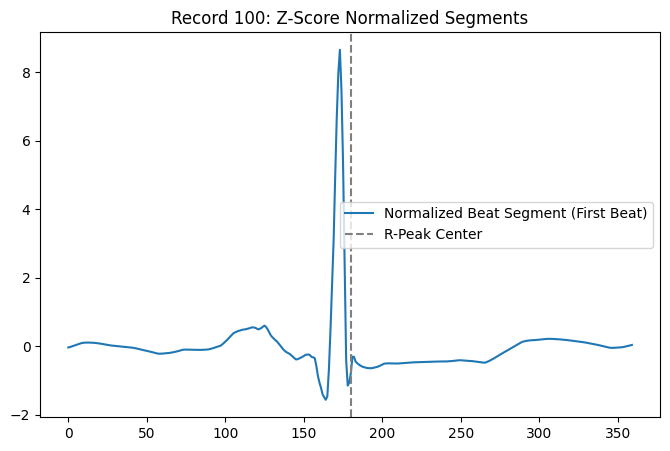

--------------------------------------------------
Total Segments Extracted: 947
Label Distribution: 
0    947
Name: count, dtype: int64

Record 101: Extracted 197 valid heartbeat segments.


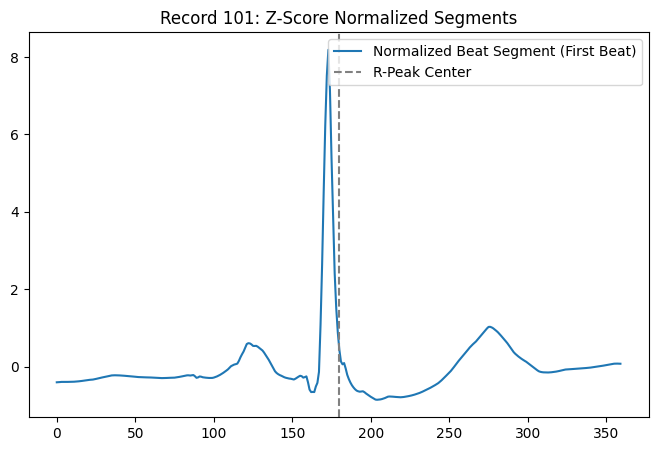

--------------------------------------------------
Total Segments Extracted: 197
Label Distribution: 
0    197
Name: count, dtype: int64

Record 103: Extracted 562 valid heartbeat segments.


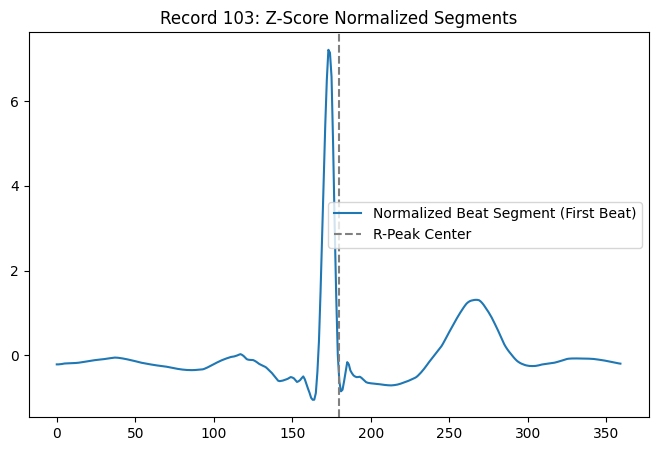

--------------------------------------------------
Total Segments Extracted: 562
Label Distribution: 
0    562
Name: count, dtype: int64

Record 105: Extracted 1618 valid heartbeat segments.


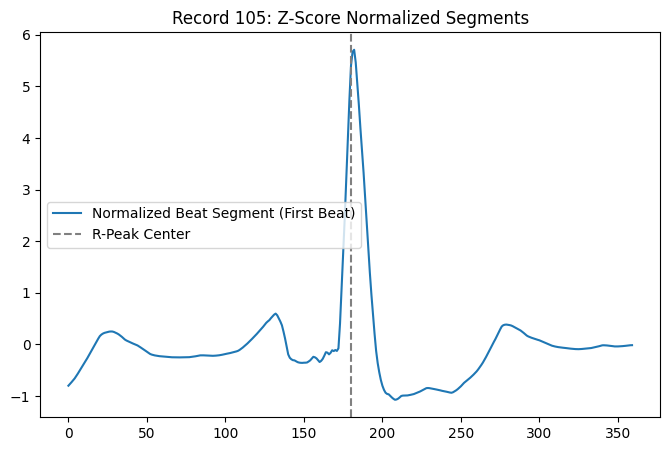

--------------------------------------------------
Total Segments Extracted: 1618
Label Distribution: 
0    1618
Name: count, dtype: int64

Record 106: Extracted 1056 valid heartbeat segments.


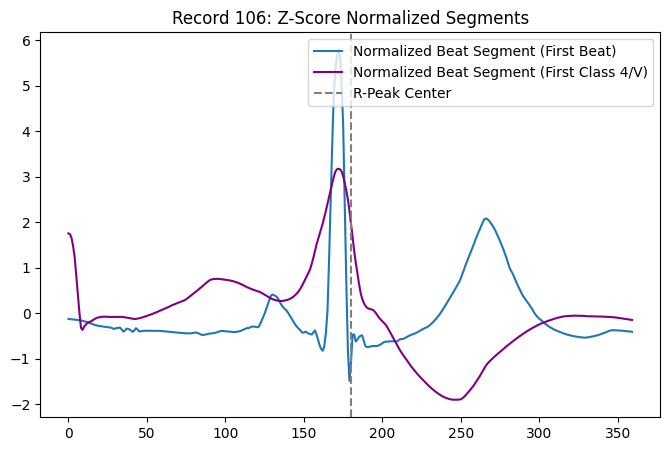

--------------------------------------------------
Total Segments Extracted: 1056
Label Distribution: 
0    1039
4      17
Name: count, dtype: int64

Record 107: Extracted 202 valid heartbeat segments.


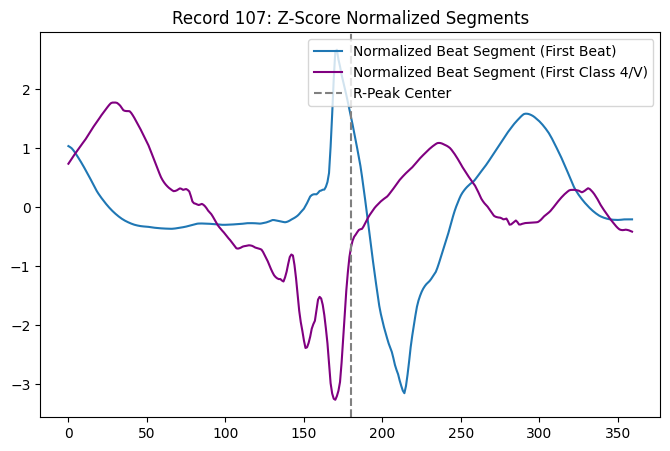

--------------------------------------------------
Total Segments Extracted: 202
Label Distribution: 
0    192
4     10
Name: count, dtype: int64

Record 108: Extracted 438 valid heartbeat segments.


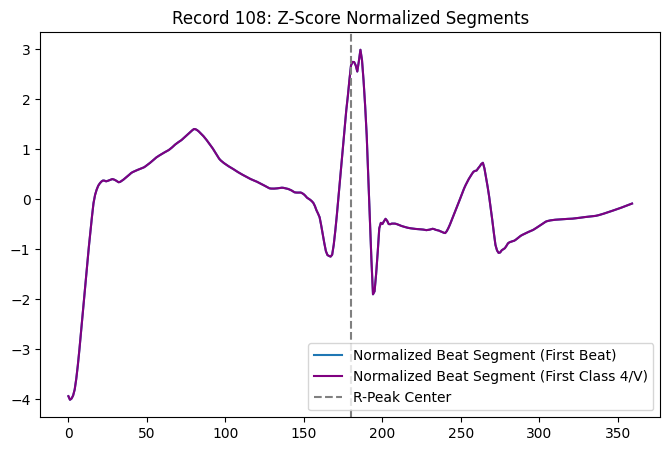

--------------------------------------------------
Total Segments Extracted: 438
Label Distribution: 
0    434
3      1
4      3
Name: count, dtype: int64

Record 109: Extracted 492 valid heartbeat segments.


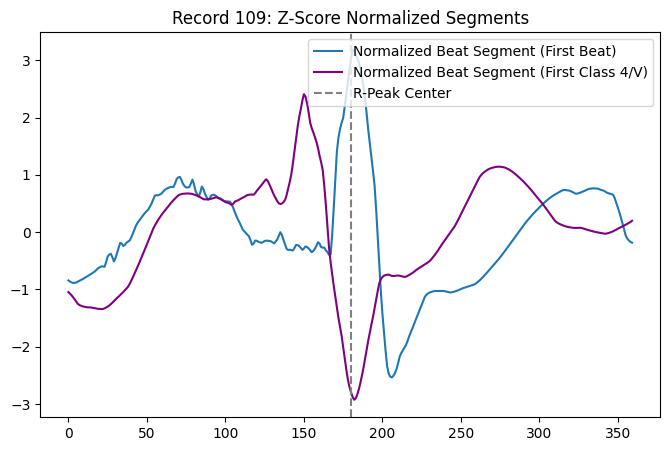

--------------------------------------------------
Total Segments Extracted: 492
Label Distribution: 
1    487
4      5
Name: count, dtype: int64

Record 111: Extracted 233 valid heartbeat segments.


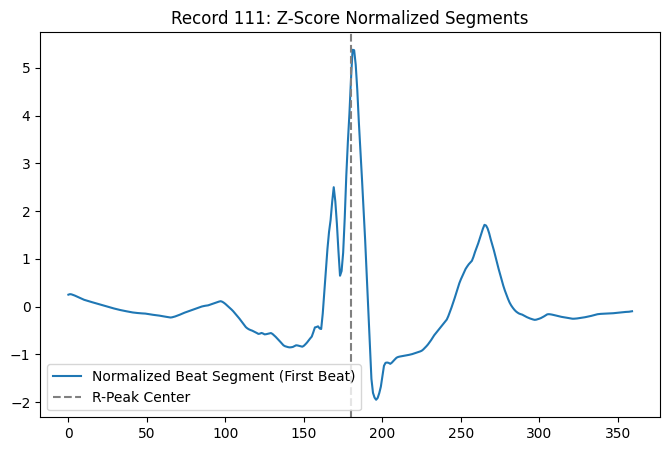

--------------------------------------------------
Total Segments Extracted: 233
Label Distribution: 
1    233
Name: count, dtype: int64

Record 112: Extracted 876 valid heartbeat segments.


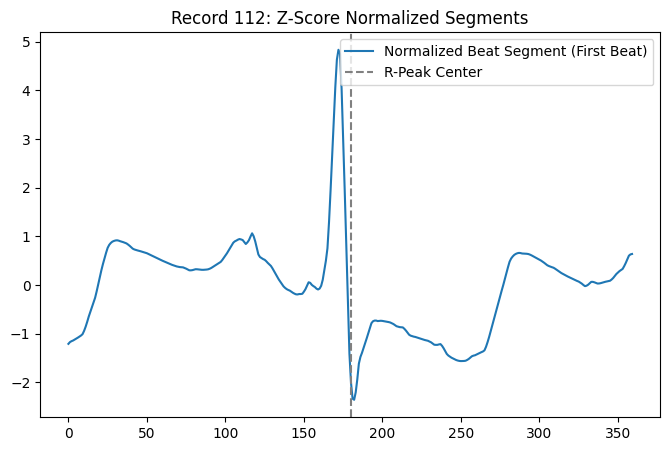

--------------------------------------------------
Total Segments Extracted: 876
Label Distribution: 
0    876
Name: count, dtype: int64

Record 113: Extracted 678 valid heartbeat segments.


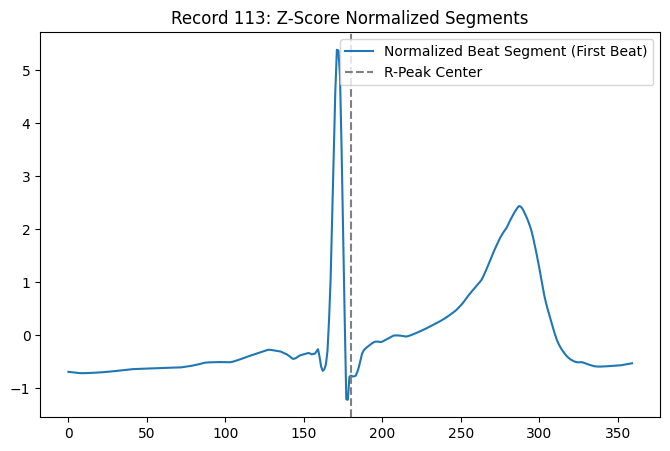

--------------------------------------------------
Total Segments Extracted: 678
Label Distribution: 
0    678
Name: count, dtype: int64

Record 114: Extracted 192 valid heartbeat segments.


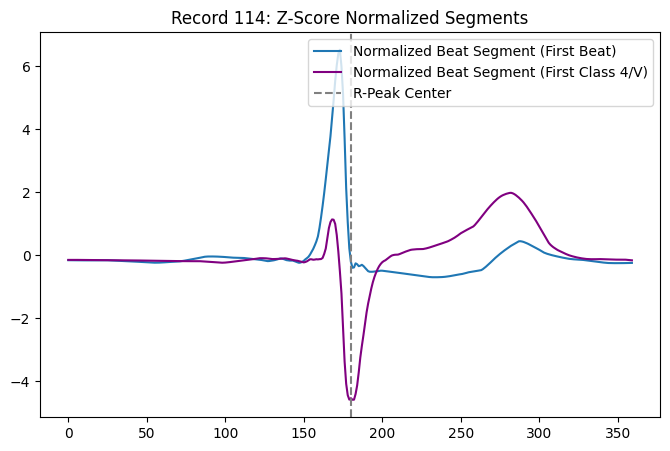

--------------------------------------------------
Total Segments Extracted: 192
Label Distribution: 
0    190
3      1
4      1
Name: count, dtype: int64

Record 115: Extracted 78 valid heartbeat segments.


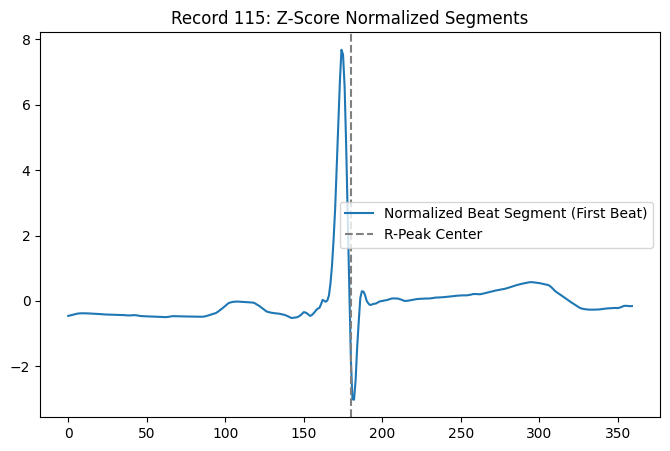

--------------------------------------------------
Total Segments Extracted: 78
Label Distribution: 
0    78
Name: count, dtype: int64

Record 116: Extracted 437 valid heartbeat segments.


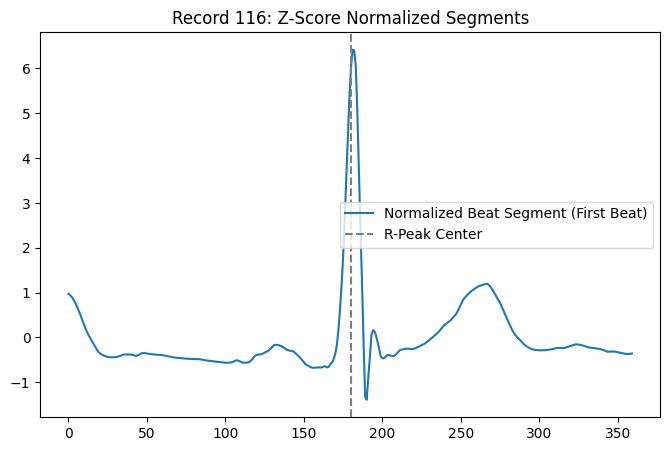

--------------------------------------------------
Total Segments Extracted: 437
Label Distribution: 
0    437
Name: count, dtype: int64

Record 117: Extracted 367 valid heartbeat segments.


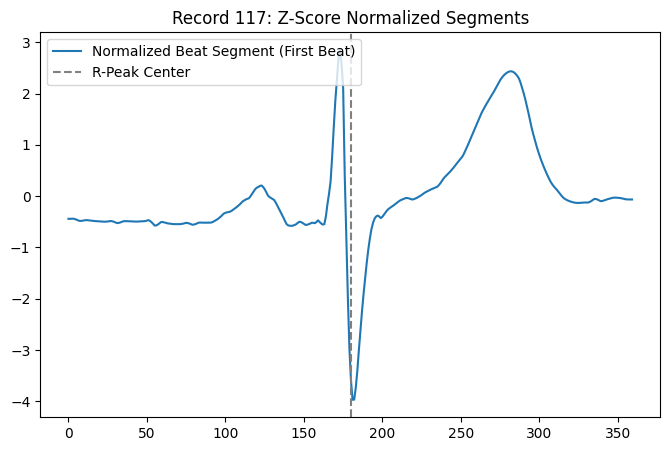

--------------------------------------------------
Total Segments Extracted: 367
Label Distribution: 
0    367
Name: count, dtype: int64

Record 118: Extracted 212 valid heartbeat segments.


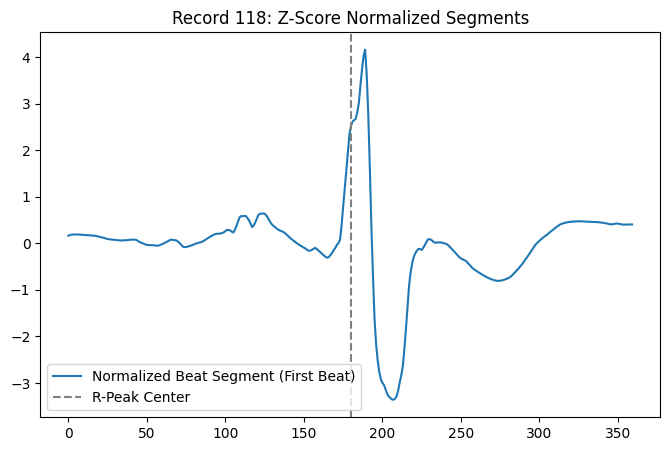

--------------------------------------------------
Total Segments Extracted: 212
Label Distribution: 
2    211
3      1
Name: count, dtype: int64

Record 119: Extracted 768 valid heartbeat segments.


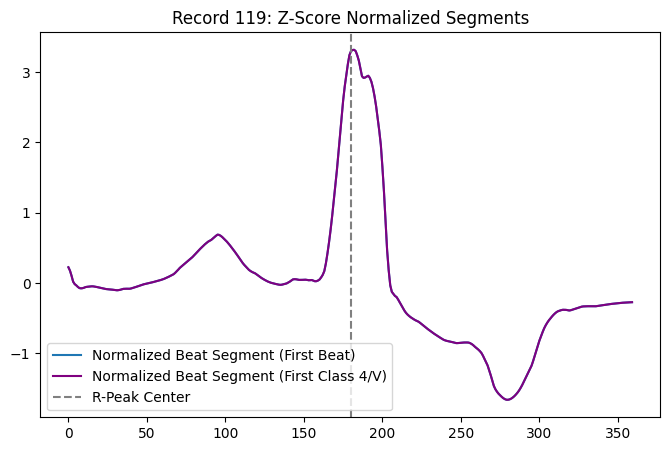

--------------------------------------------------
Total Segments Extracted: 768
Label Distribution: 
0    580
4    188
Name: count, dtype: int64

Record 121: Extracted 661 valid heartbeat segments.


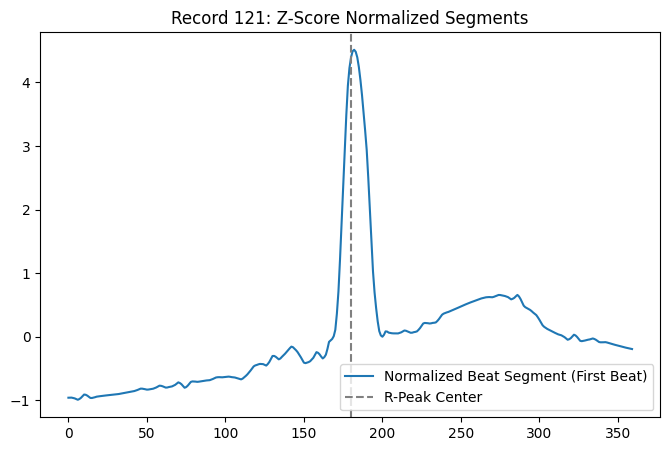

--------------------------------------------------
Total Segments Extracted: 661
Label Distribution: 
0    661
Name: count, dtype: int64

Record 122: Extracted 1867 valid heartbeat segments.


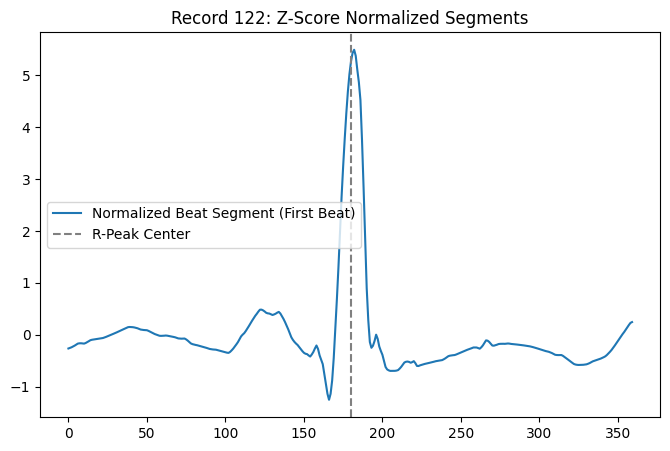

--------------------------------------------------
Total Segments Extracted: 1867
Label Distribution: 
0    1867
Name: count, dtype: int64

Record 123: Extracted 66 valid heartbeat segments.


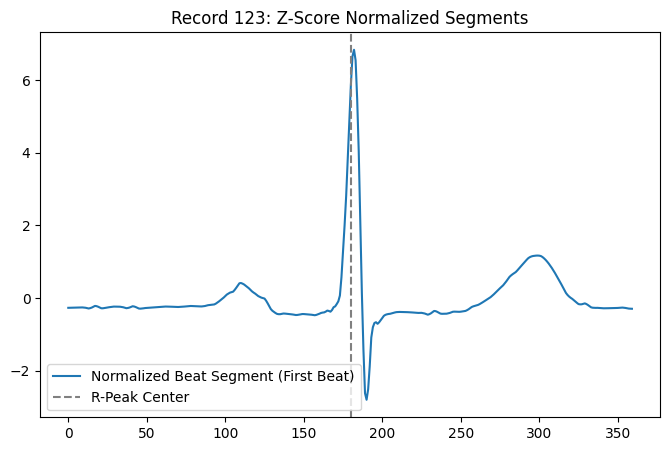

--------------------------------------------------
Total Segments Extracted: 66
Label Distribution: 
0    66
Name: count, dtype: int64

Record 124: Extracted 537 valid heartbeat segments.


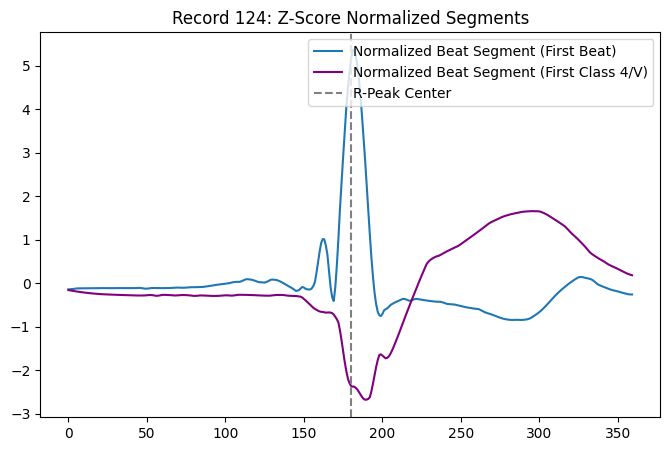

--------------------------------------------------
Total Segments Extracted: 537
Label Distribution: 
0      6
2    520
4     11
Name: count, dtype: int64

Record 200: Extracted 625 valid heartbeat segments.


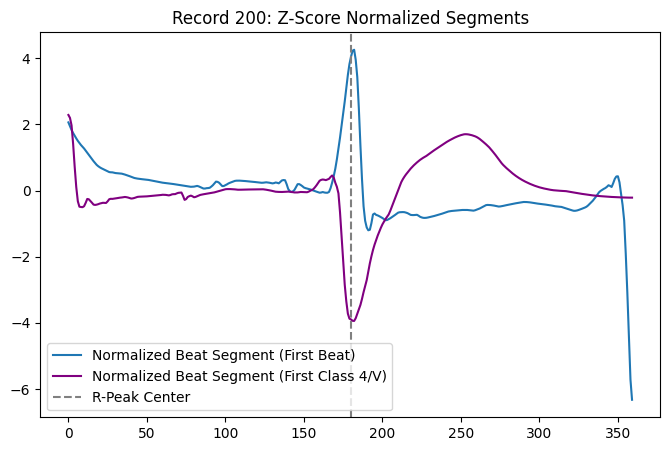

--------------------------------------------------
Total Segments Extracted: 625
Label Distribution: 
0    356
3      3
4    266
Name: count, dtype: int64

Record 201: Extracted 254 valid heartbeat segments.


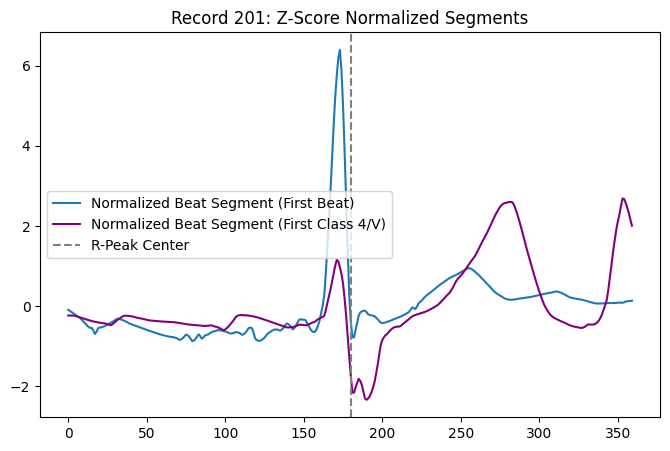

--------------------------------------------------
Total Segments Extracted: 254
Label Distribution: 
0    239
3      3
4     12
Name: count, dtype: int64

Record 202: Extracted 201 valid heartbeat segments.


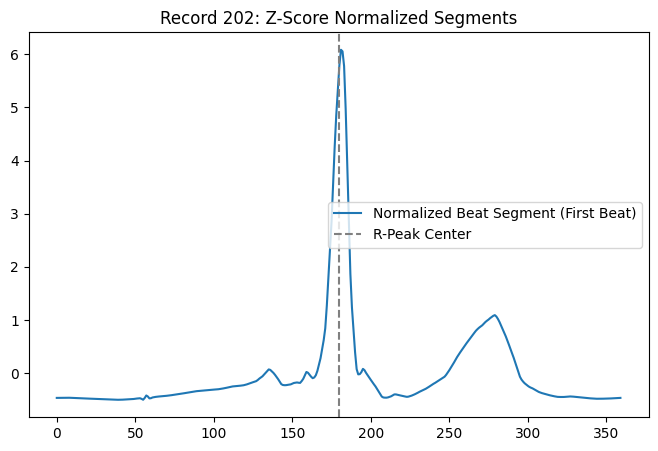

--------------------------------------------------
Total Segments Extracted: 201
Label Distribution: 
0    196
3      5
Name: count, dtype: int64

Record 203: Extracted 742 valid heartbeat segments.


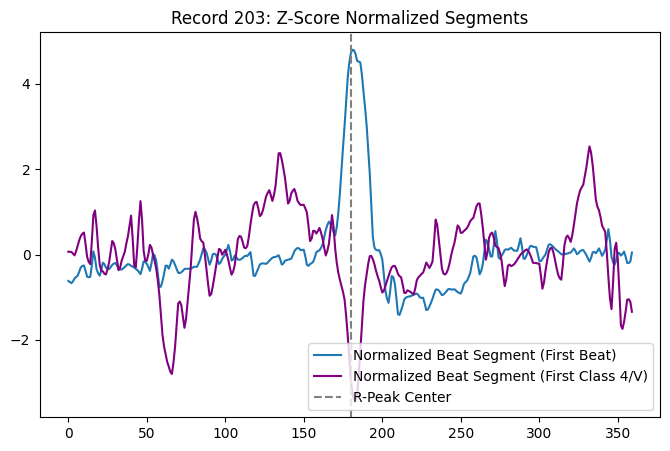

--------------------------------------------------
Total Segments Extracted: 742
Label Distribution: 
0    587
4    155
Name: count, dtype: int64

Record 205: Extracted 900 valid heartbeat segments.


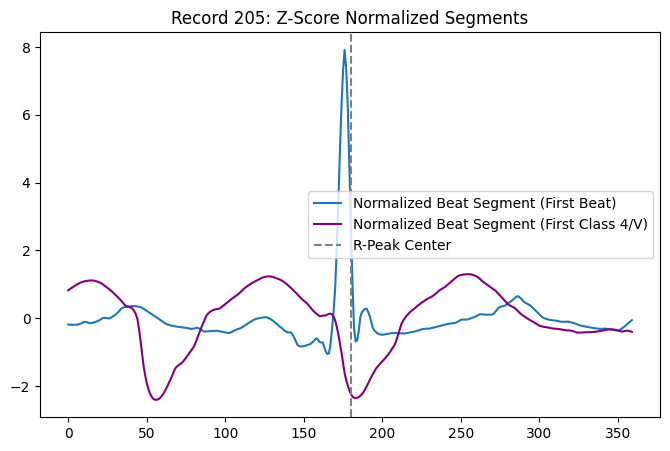

--------------------------------------------------
Total Segments Extracted: 900
Label Distribution: 
0    888
4     12
Name: count, dtype: int64

Record 207: Extracted 349 valid heartbeat segments.


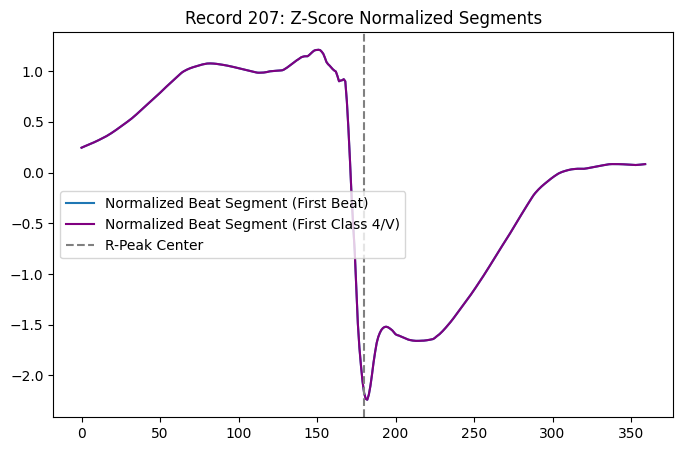

--------------------------------------------------
Total Segments Extracted: 349
Label Distribution: 
0      1
1    263
2      8
3     45
4     32
Name: count, dtype: int64

Record 208: Extracted 945 valid heartbeat segments.


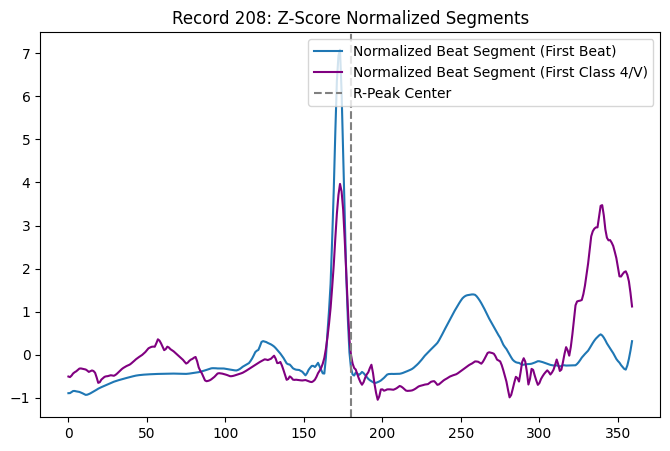

--------------------------------------------------
Total Segments Extracted: 945
Label Distribution: 
0    907
4     38
Name: count, dtype: int64

Record 209: Extracted 645 valid heartbeat segments.


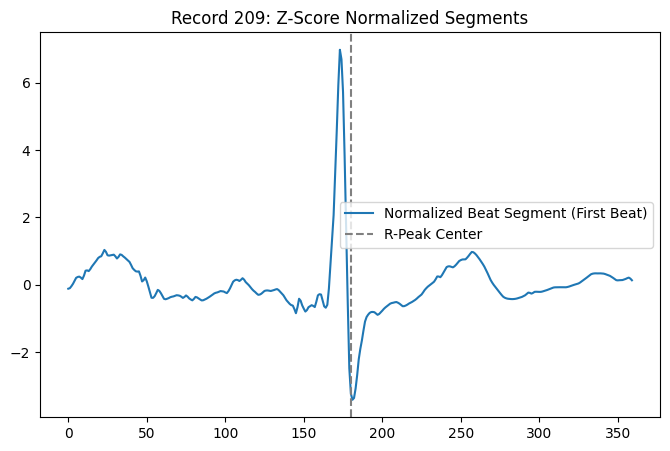

--------------------------------------------------
Total Segments Extracted: 645
Label Distribution: 
0    616
3     29
Name: count, dtype: int64

Record 210: Extracted 312 valid heartbeat segments.


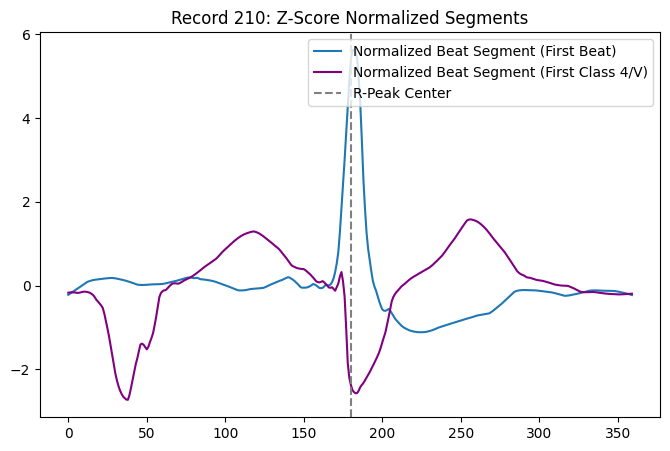

--------------------------------------------------
Total Segments Extracted: 312
Label Distribution: 
0    292
4     20
Name: count, dtype: int64

Record 212: Extracted 1853 valid heartbeat segments.


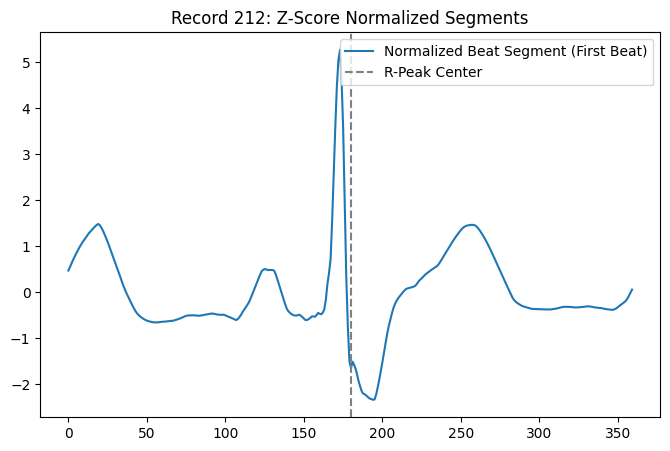

--------------------------------------------------
Total Segments Extracted: 1853
Label Distribution: 
0     682
2    1171
Name: count, dtype: int64

Record 213: Extracted 1326 valid heartbeat segments.


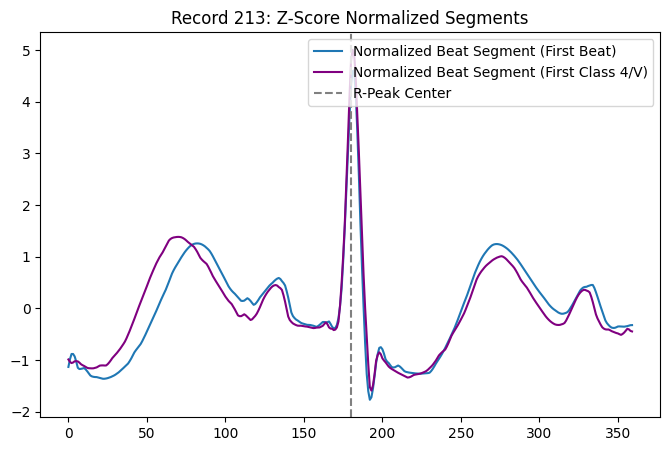

--------------------------------------------------
Total Segments Extracted: 1326
Label Distribution: 
0    1090
3       4
4     232
Name: count, dtype: int64

Record 214: Extracted 337 valid heartbeat segments.


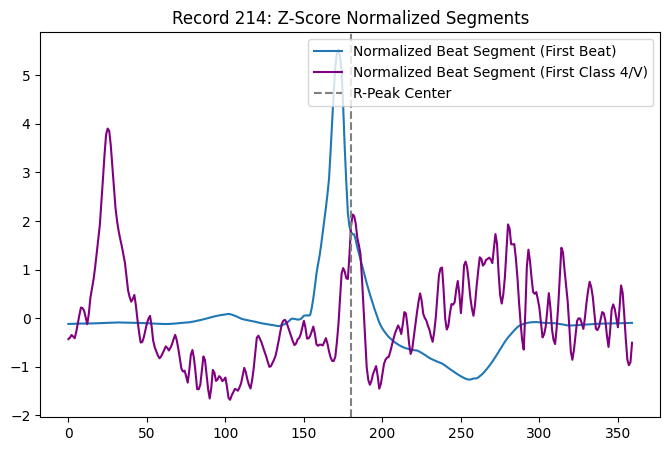

--------------------------------------------------
Total Segments Extracted: 337
Label Distribution: 
1    317
4     20
Name: count, dtype: int64

Record 215: Extracted 341 valid heartbeat segments.


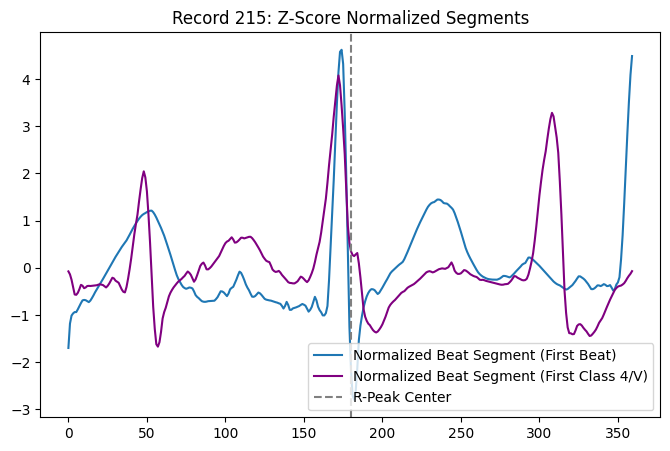

--------------------------------------------------
Total Segments Extracted: 341
Label Distribution: 
0    338
4      3
Name: count, dtype: int64

Record 217: Extracted 66 valid heartbeat segments.


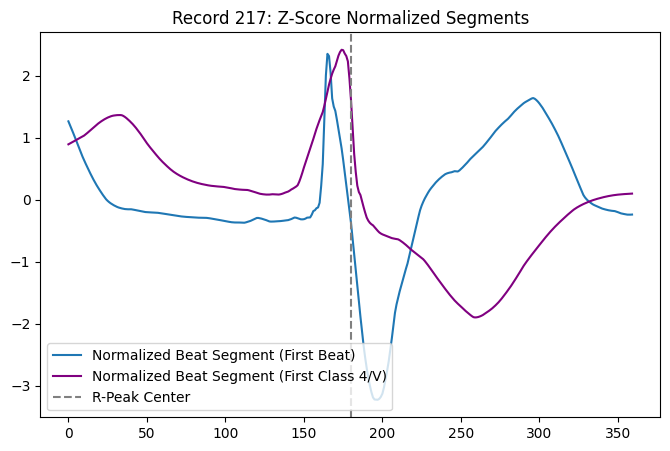

--------------------------------------------------
Total Segments Extracted: 66
Label Distribution: 
0    60
4     6
Name: count, dtype: int64

Record 219: Extracted 346 valid heartbeat segments.


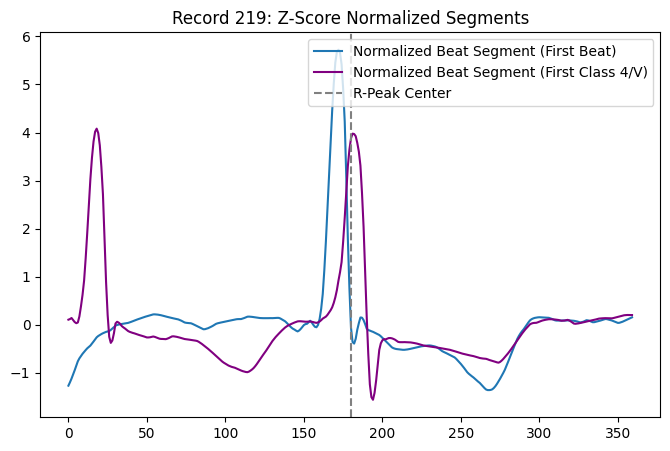

--------------------------------------------------
Total Segments Extracted: 346
Label Distribution: 
0    344
4      2
Name: count, dtype: int64

Record 220: Extracted 129 valid heartbeat segments.


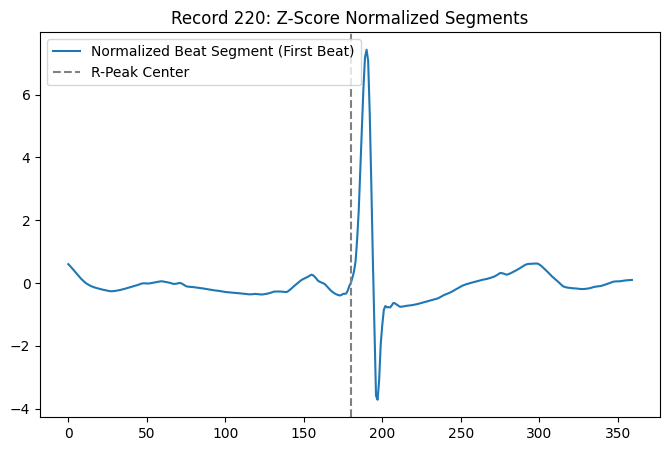

--------------------------------------------------
Total Segments Extracted: 129
Label Distribution: 
0    124
3      5
Name: count, dtype: int64

Record 221: Extracted 288 valid heartbeat segments.


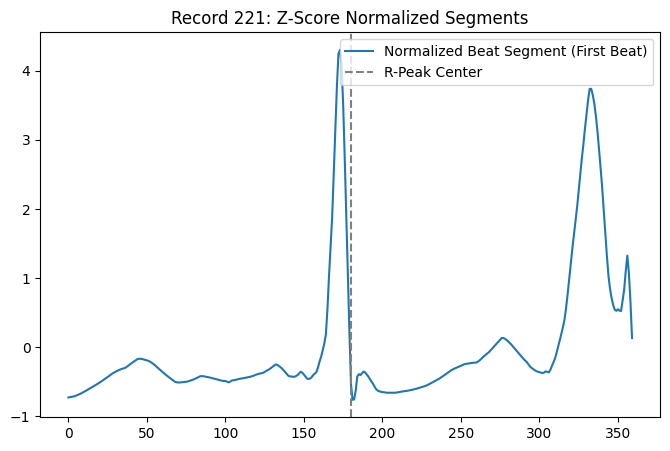

--------------------------------------------------
Total Segments Extracted: 288
Label Distribution: 
0    288
Name: count, dtype: int64

Record 222: Extracted 1649 valid heartbeat segments.


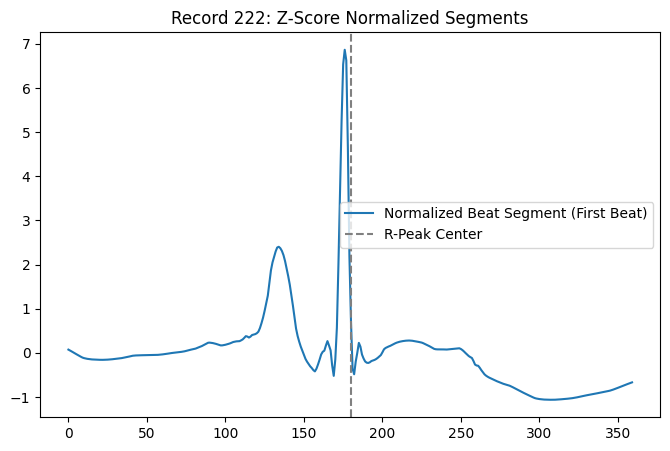

--------------------------------------------------
Total Segments Extracted: 1649
Label Distribution: 
0    1597
3      52
Name: count, dtype: int64

Record 223: Extracted 417 valid heartbeat segments.


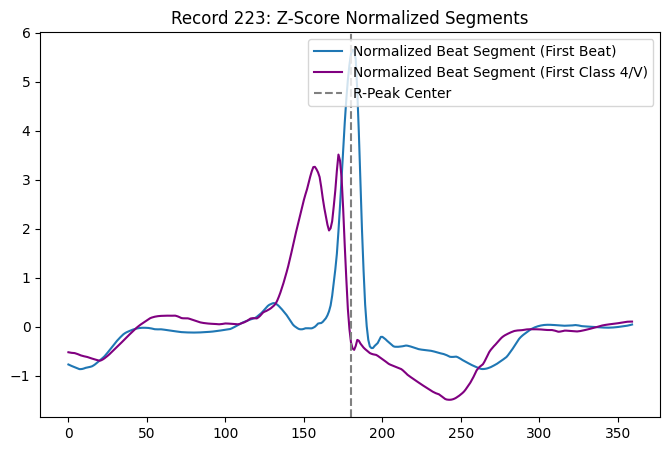

--------------------------------------------------
Total Segments Extracted: 417
Label Distribution: 
0    373
3      8
4     36
Name: count, dtype: int64

Record 228: Extracted 825 valid heartbeat segments.


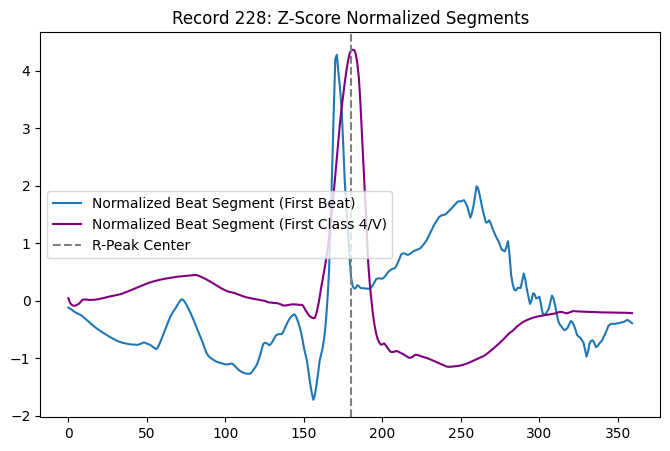

--------------------------------------------------
Total Segments Extracted: 825
Label Distribution: 
0    722
3      2
4    101
Name: count, dtype: int64

Record 230: Extracted 199 valid heartbeat segments.


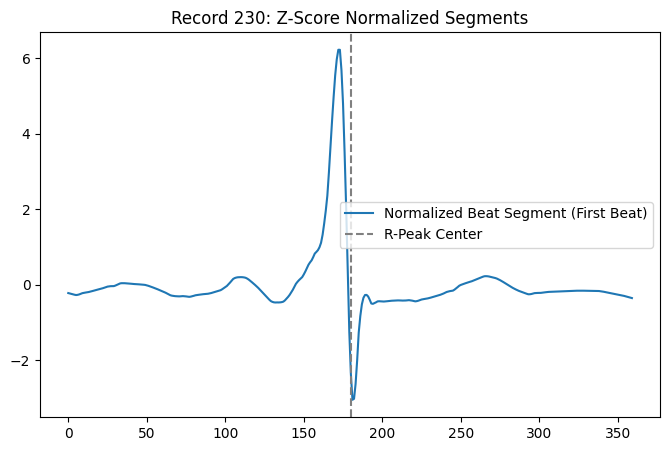

--------------------------------------------------
Total Segments Extracted: 199
Label Distribution: 
0    199
Name: count, dtype: int64

Record 231: Extracted 551 valid heartbeat segments.


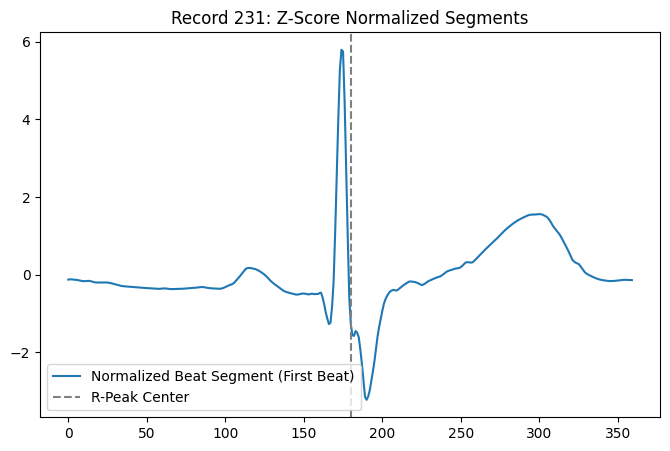

--------------------------------------------------
Total Segments Extracted: 551
Label Distribution: 
0    133
2    418
Name: count, dtype: int64

Record 232: Extracted 430 valid heartbeat segments.


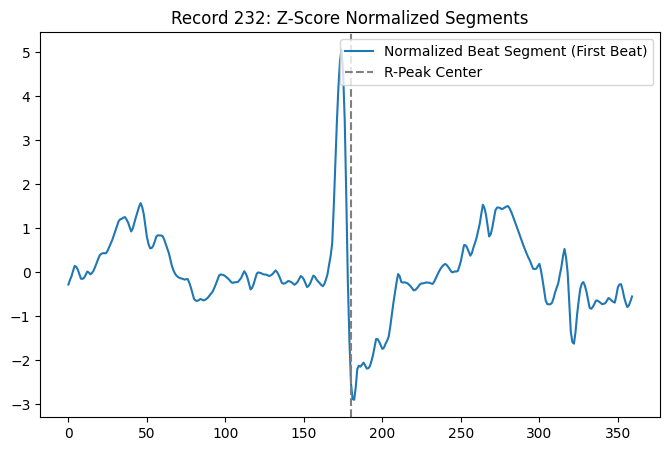

--------------------------------------------------
Total Segments Extracted: 430
Label Distribution: 
2    105
3    325
Name: count, dtype: int64

Record 233: Extracted 1153 valid heartbeat segments.


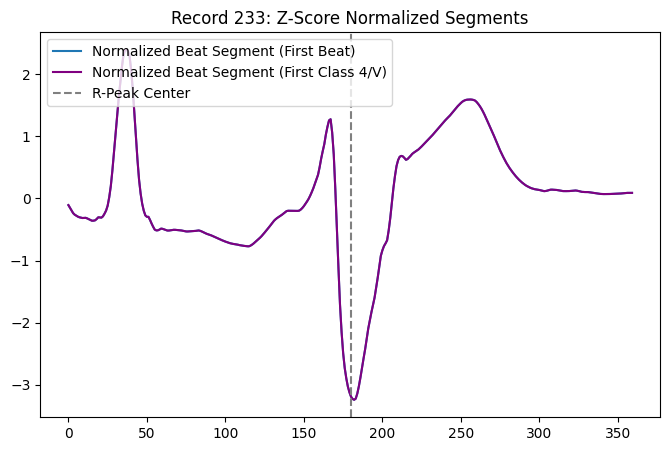

--------------------------------------------------
Total Segments Extracted: 1153
Label Distribution: 
0    809
3      1
4    343
Name: count, dtype: int64

Record 234: Extracted 2280 valid heartbeat segments.


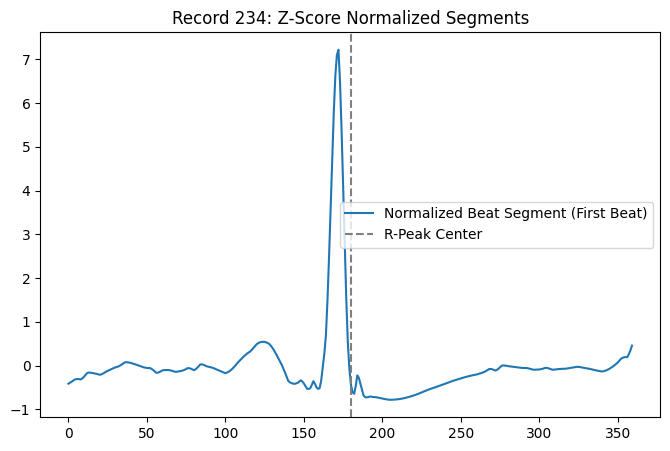

--------------------------------------------------
Total Segments Extracted: 2280
Label Distribution: 
0    2280
Name: count, dtype: int64


In [37]:
def pan_tompkins_rpeak_detection(signal):
    _, info = nk.ecg_peaks(
        signal, sampling_rate=360, method="pantompkins1985", correct_artifacts=True
    )
    return info['ECG_R_Peaks']


def segment_and_normalize_beats(signal, r_peak_indices, record_id):
    ann = ekg_records[record_id].annotations

    # filter annotations to only those we've defined in CLASS_MAP and TARGET_CLASSES
    valid_ann = ann[ann["annotation_symbol"].isin(CLASS_MAP.keys())].copy()
    valid_ann["target_type"] = valid_ann["annotation_symbol"].map(CLASS_MAP)
    valid_ann = valid_ann[valid_ann["target_type"].isin(TARGET_CLASSES.keys())].copy()

    segments = []
    labels = []

    for r_idx in r_peak_indices:
        # find closest annotation to the detected R-peak
        distances = np.abs(valid_ann["index"] - r_idx)
        closest_ann_idx = distances.argmin()

        # detected R-peak must be within the 10-sample tolerance
        if distances.iloc[closest_ann_idx] < 10:
            start_idx = r_idx - WINDOW_BEFORE_R
            end_idx = r_idx + WINDOW_AFTER_R

            # signal must be long enough to extract the complete P-QRS-T complex
            if start_idx >= 0 and end_idx <= len(signal):
                segment = signal[start_idx:end_idx]

                mean = np.mean(segment)
                std_dev = np.std(segment)

                # z-score normalization mitigates amplitude variability/bias
                # centering: segment's average amplitude is zero -> removes DC offset or baseline drift
                # scaling: segment's standard deviation is one = >> all beats will have the same relative spread of amplitude values
                if std_dev > 1e-6:
                    normalized_segment = (segment - mean) / std_dev
                else:
                    normalized_segment = segment - mean

                segments.append(normalized_segment)

                label = TARGET_CLASSES[valid_ann.iloc[closest_ann_idx]["target_type"]]
                labels.append(label)

    print(f"\nRecord {record_id}: Extracted {len(segments)} valid heartbeat segments.")

    if segments:
        import matplotlib.pyplot as plt

        plt.figure(figsize=(8, 5))
        segments_arr = np.array(segments)
        labels_arr = np.array(labels)

        plt.plot(segments_arr[0], label="Normalized Beat Segment (First Beat)")
        if 4 in labels_arr:
            plt.plot(
                segments_arr[labels_arr == 4][0],
                label="Normalized Beat Segment (First Class 4/V)",
                color="purple",
            )

        plt.axvline(
            x=WINDOW_BEFORE_R, color="gray", linestyle="--", label="R-Peak Center"
        )
        plt.title(f"Record {record_id}: Z-Score Normalized Segments")
        plt.legend()
        plt.show()

    return np.array(segments), np.array(labels)


for ekg, denoised_signal in denoised_ekgs.items():
    r_peaks = pan_tompkins_rpeak_detection(denoised_signal)
    X_segments, y_labels = segment_and_normalize_beats(denoised_signal, r_peaks, ekg)

    print("-" * 50)
    print(f"Total Segments Extracted: {len(X_segments)}")
    print(f"Label Distribution: \n{pd.Series(y_labels).value_counts().sort_index()}")


Processing Record: 100


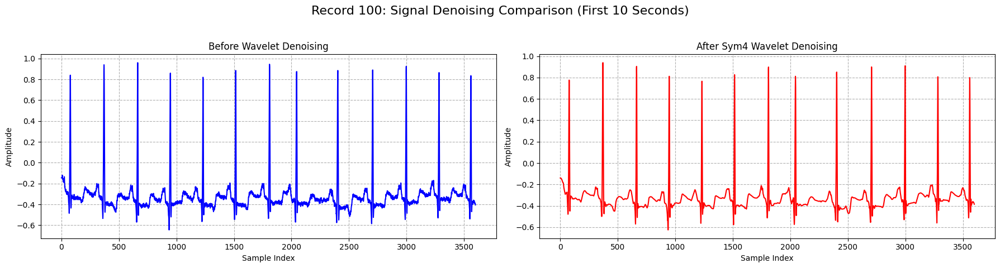


Record 100: Extracted 947 valid heartbeat segments.


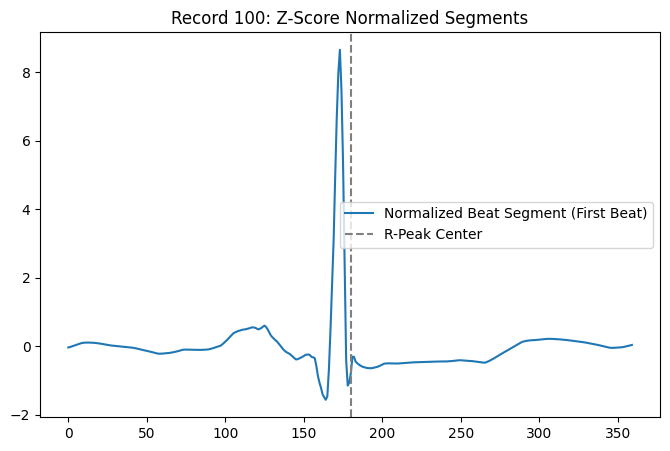


Processing Record: 101


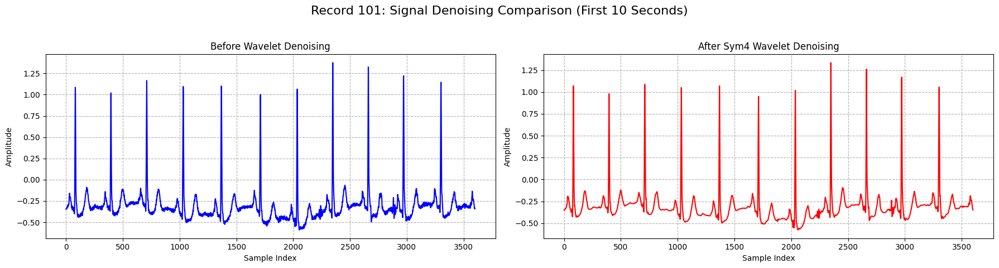


Record 101: Extracted 197 valid heartbeat segments.


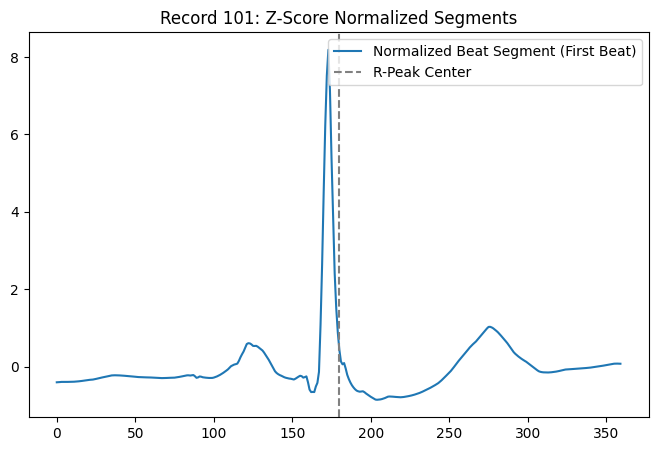


Processing Record: 103


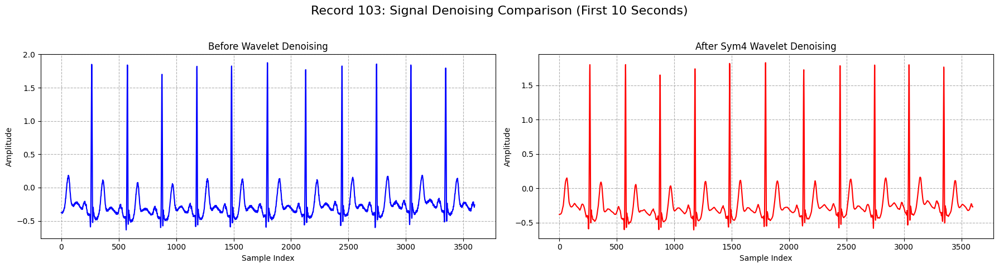


Record 103: Extracted 562 valid heartbeat segments.


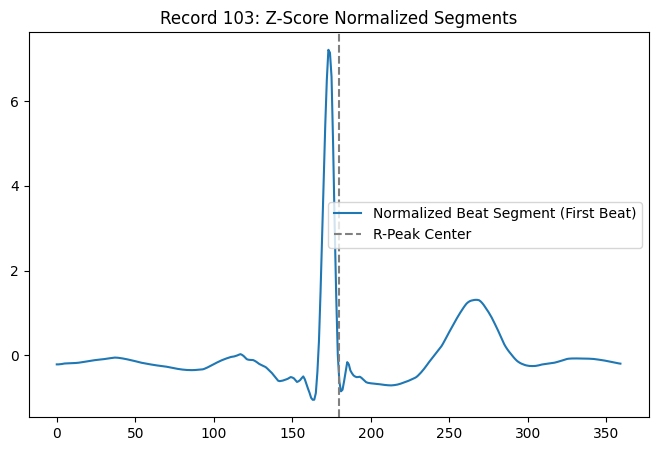


Processing Record: 105


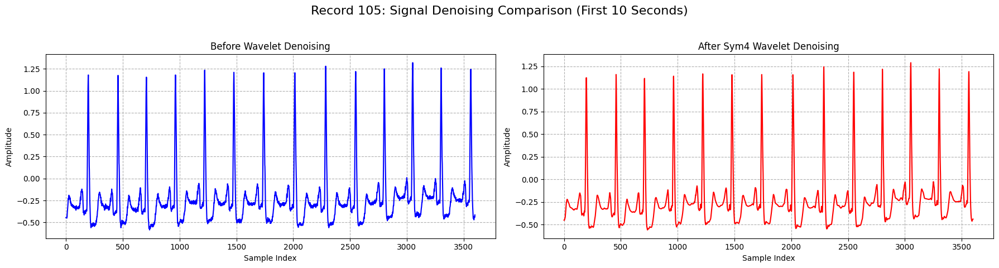


Record 105: Extracted 1618 valid heartbeat segments.


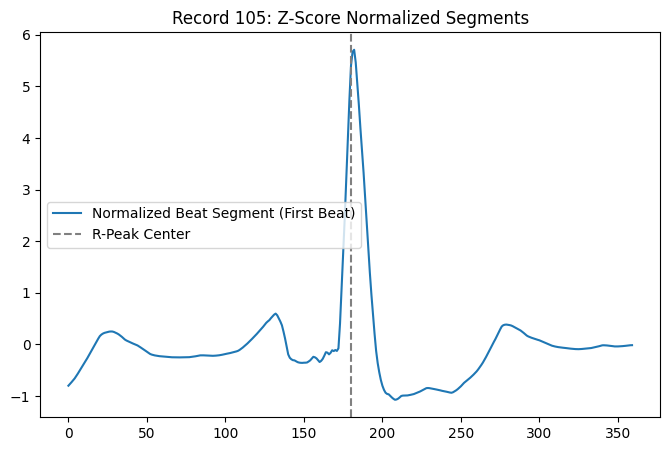


Processing Record: 106


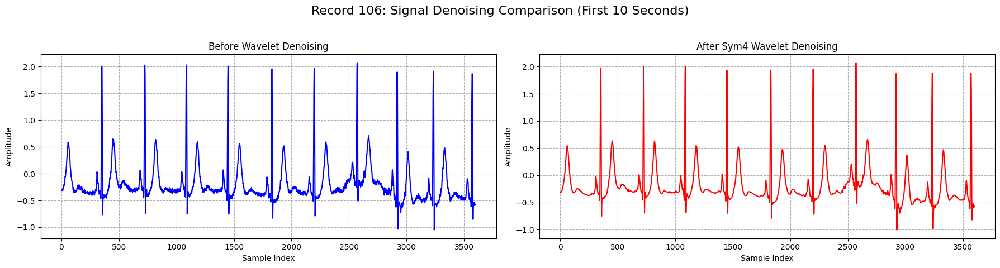


Record 106: Extracted 1056 valid heartbeat segments.


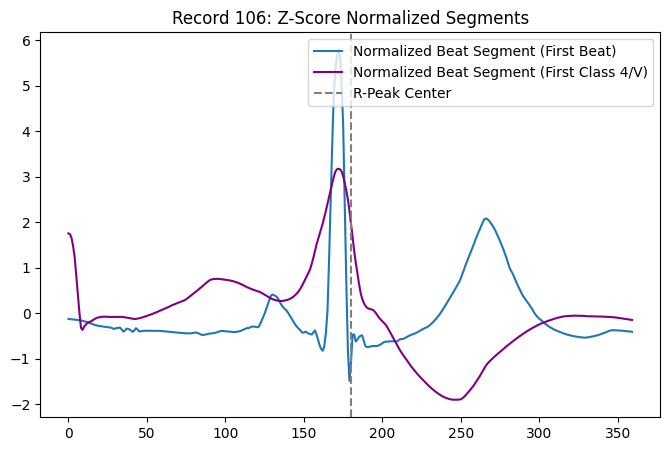


Processing Record: 107


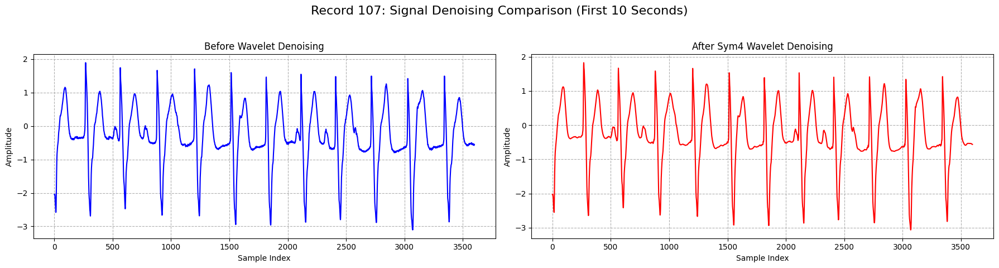


Record 107: Extracted 202 valid heartbeat segments.


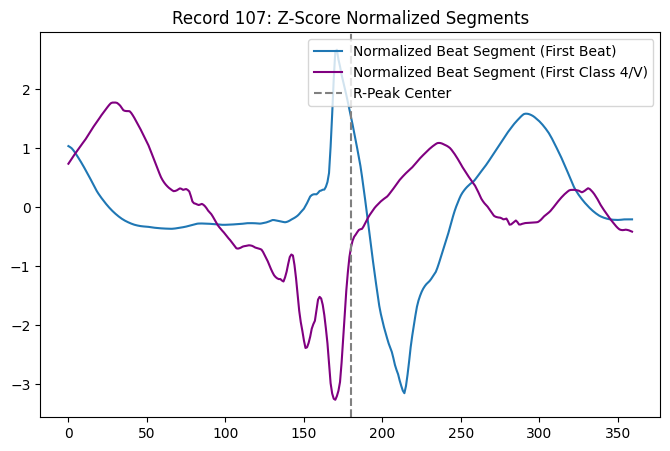


Processing Record: 108


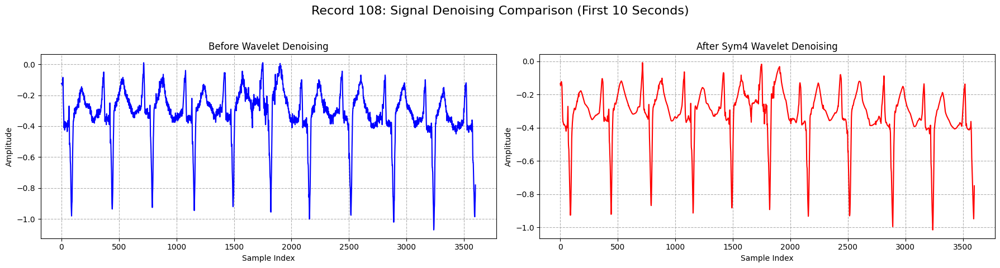


Record 108: Extracted 438 valid heartbeat segments.


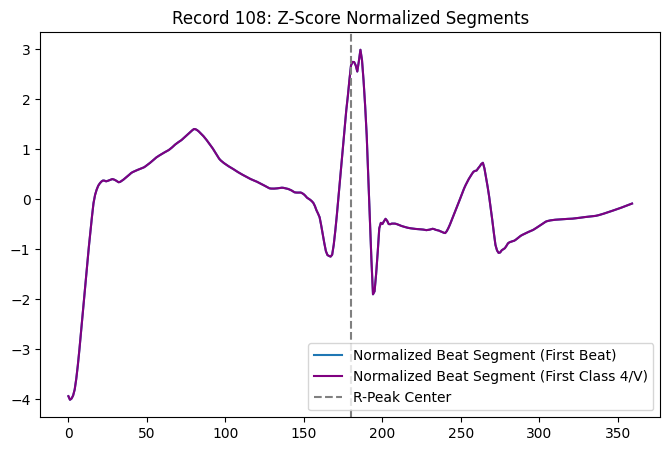


Processing Record: 109


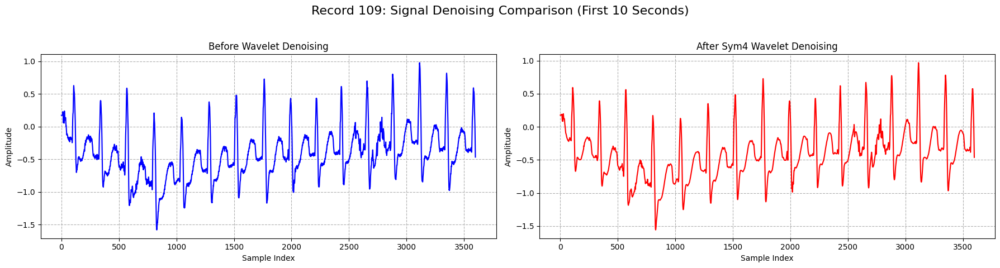


Record 109: Extracted 492 valid heartbeat segments.


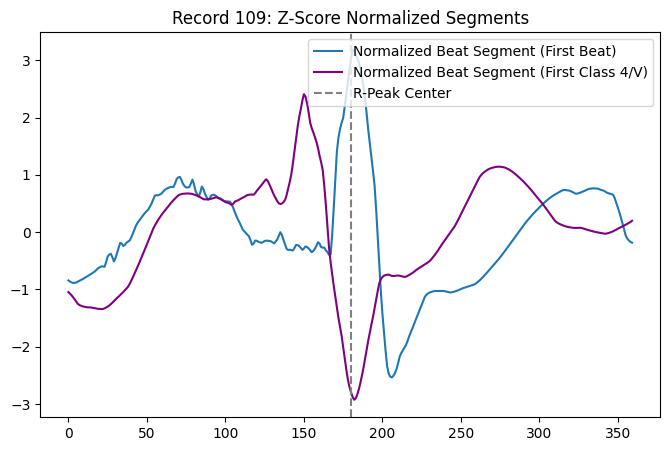


Processing Record: 111


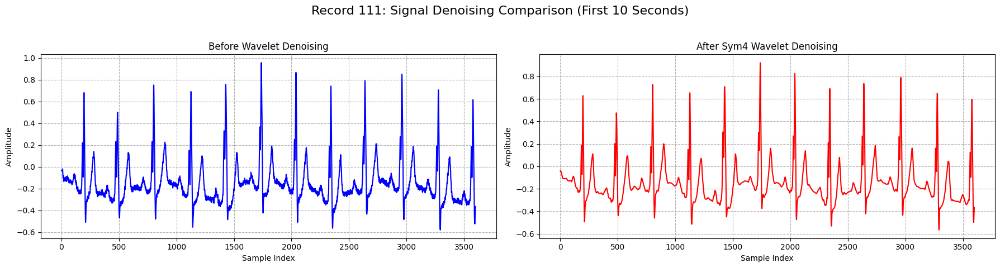


Record 111: Extracted 233 valid heartbeat segments.


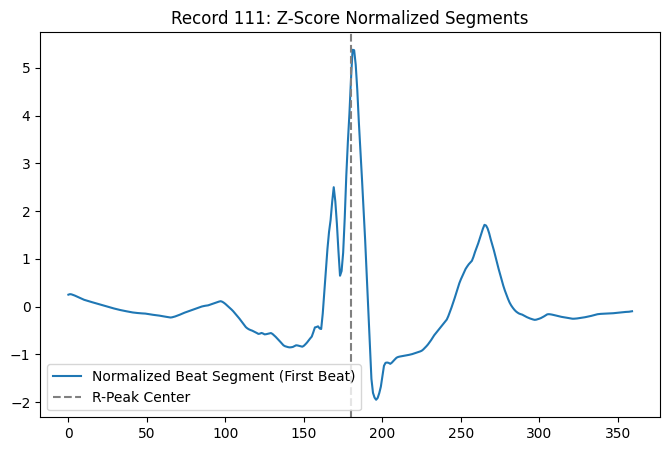


Processing Record: 112


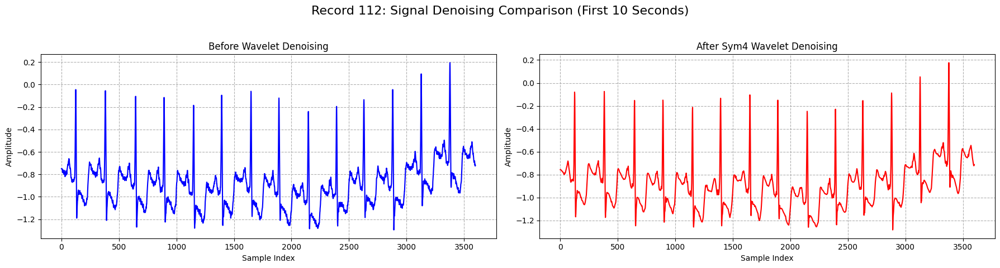


Record 112: Extracted 876 valid heartbeat segments.


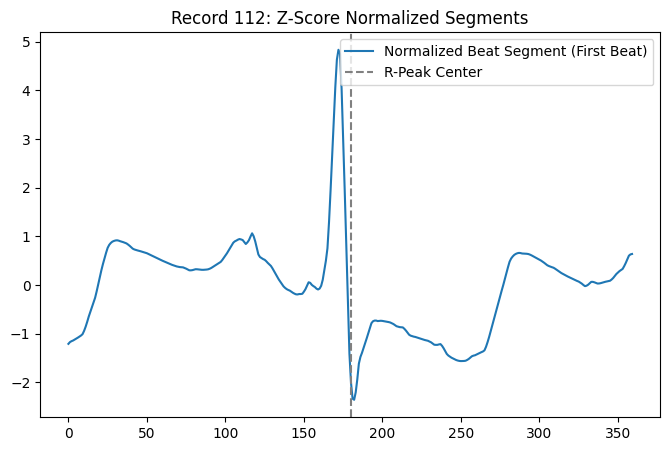


Processing Record: 113


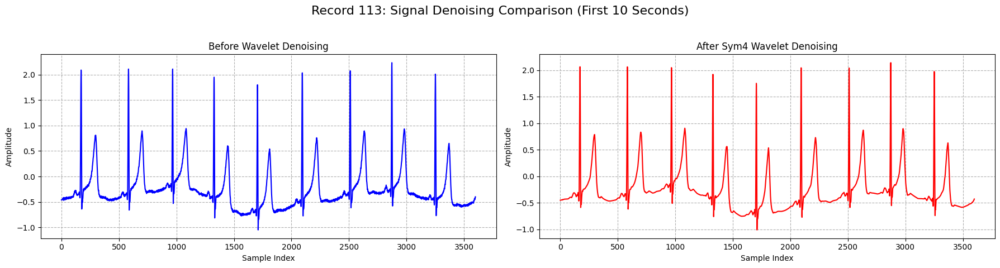


Record 113: Extracted 678 valid heartbeat segments.


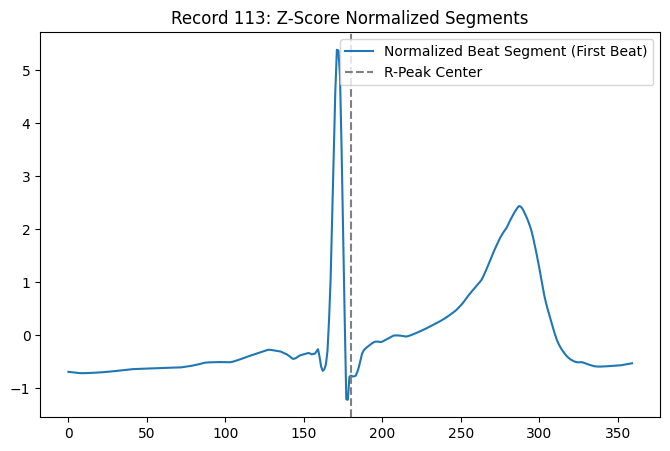


Processing Record: 114


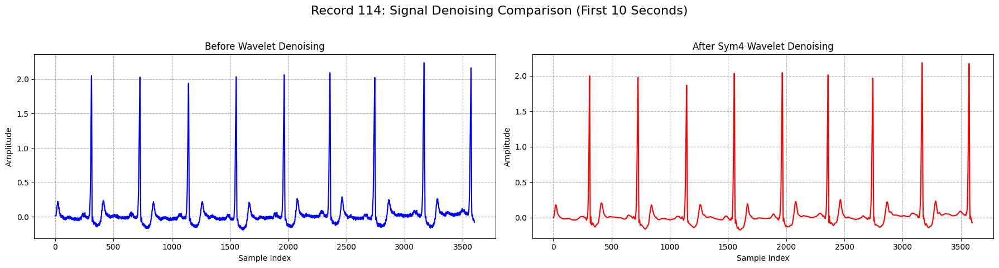


Record 114: Extracted 192 valid heartbeat segments.


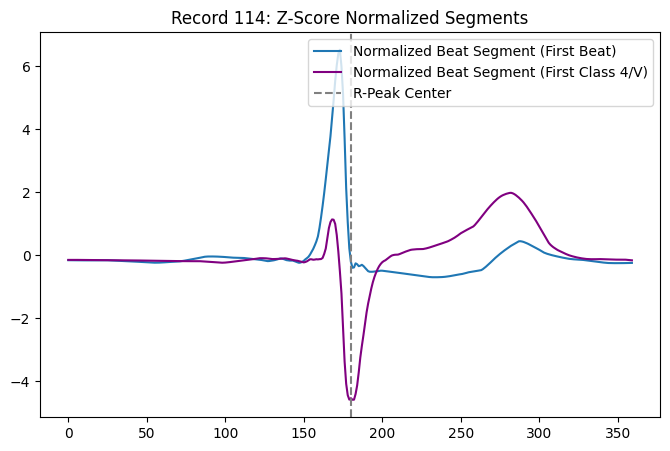


Processing Record: 115


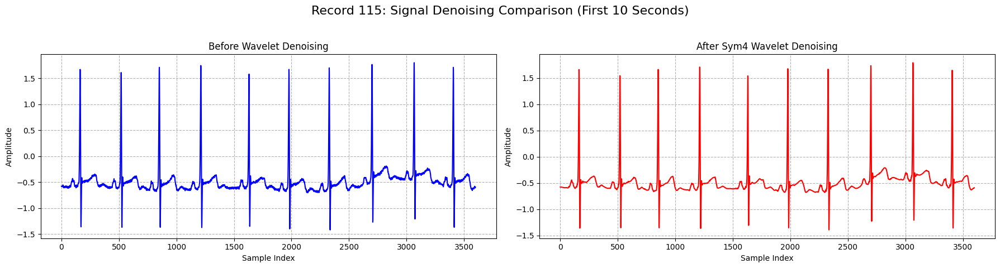


Record 115: Extracted 78 valid heartbeat segments.


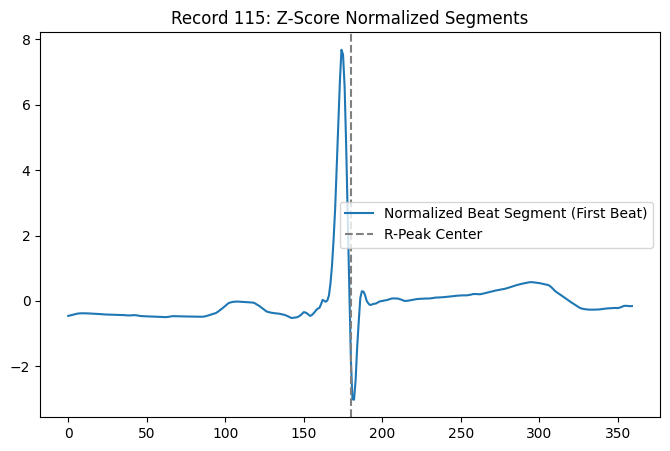


Processing Record: 116


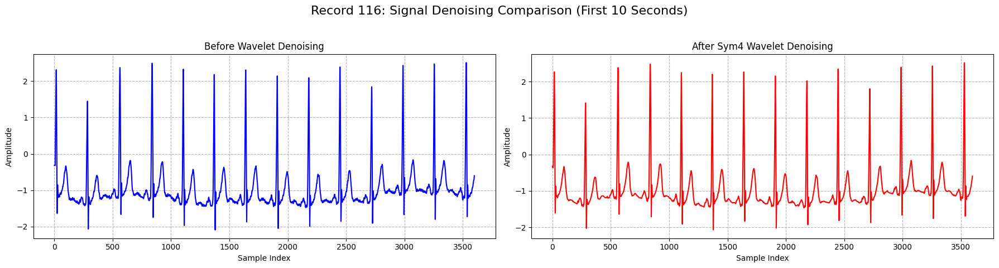


Record 116: Extracted 437 valid heartbeat segments.


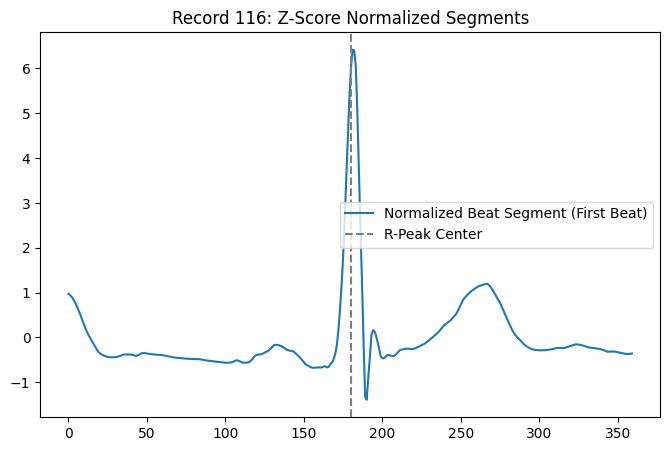


Processing Record: 117


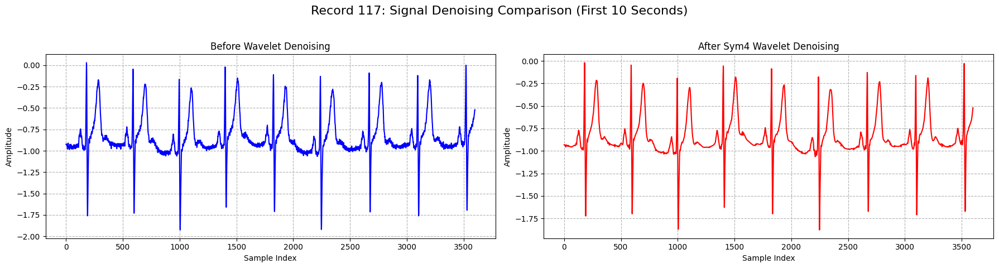


Record 117: Extracted 367 valid heartbeat segments.


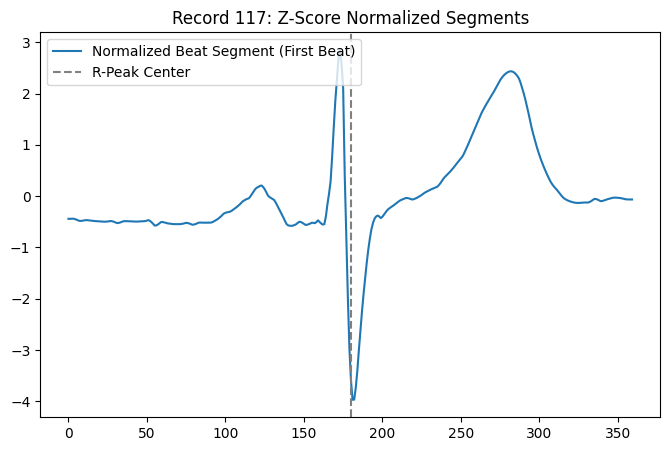


Processing Record: 118


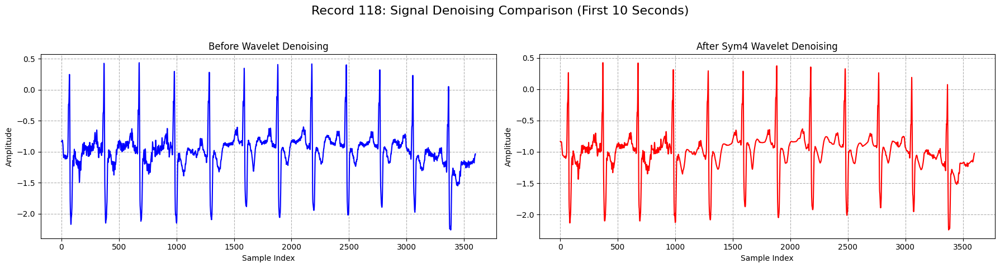


Record 118: Extracted 212 valid heartbeat segments.


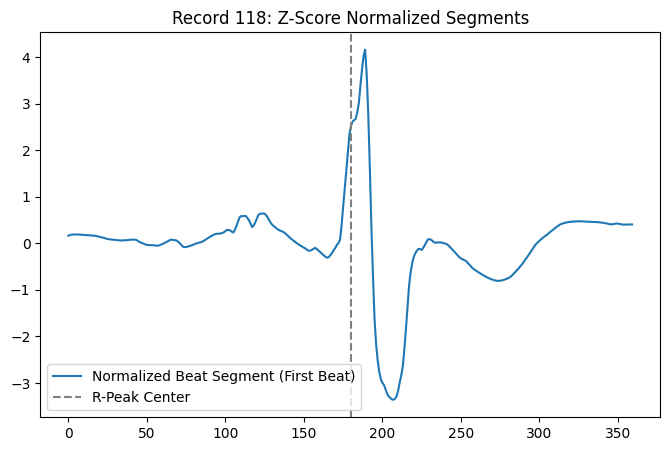


Processing Record: 119


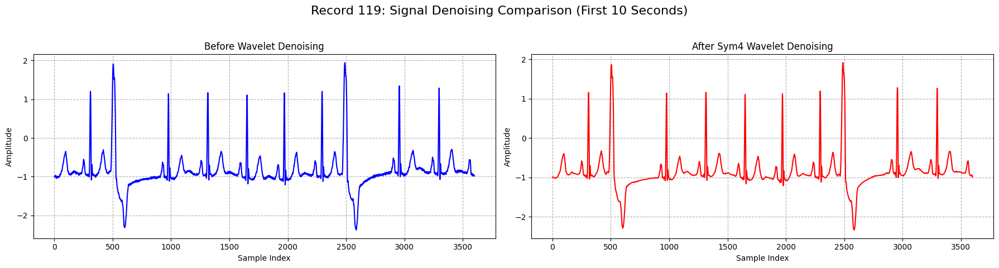


Record 119: Extracted 768 valid heartbeat segments.


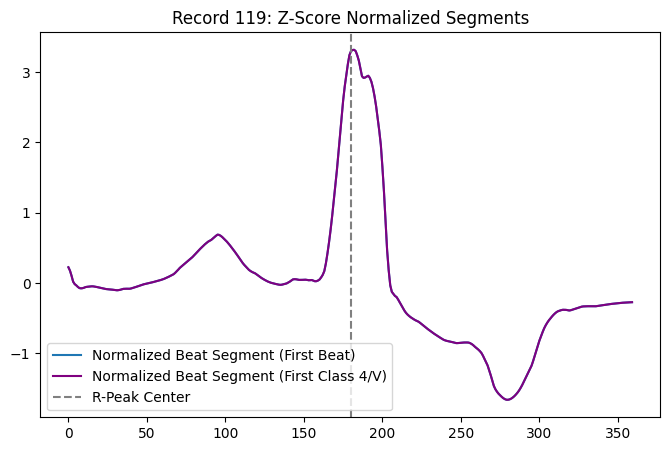


Processing Record: 121


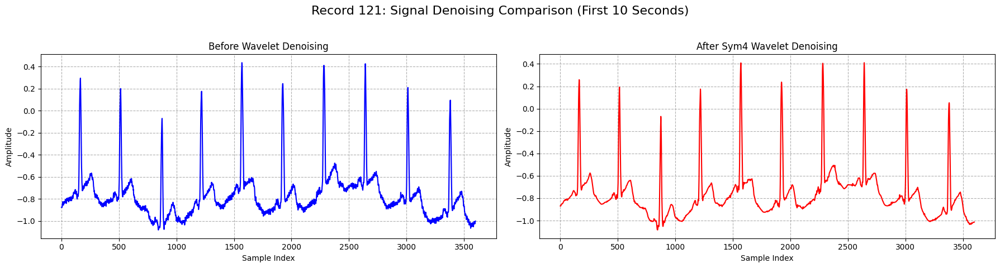


Record 121: Extracted 661 valid heartbeat segments.


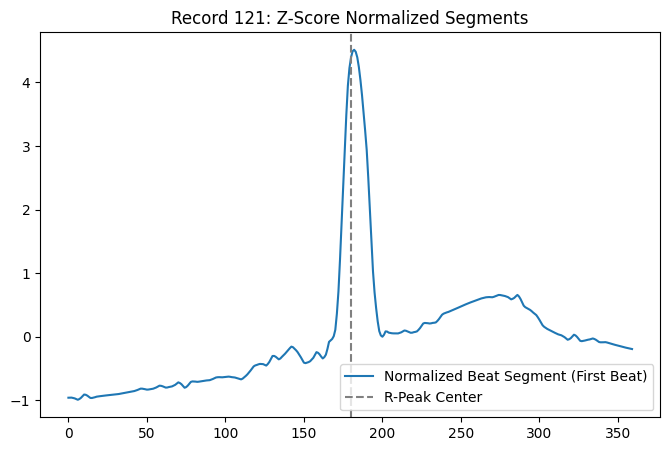


Processing Record: 122


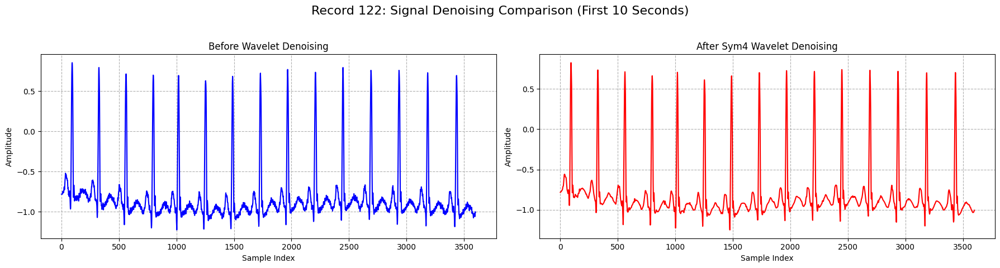


Record 122: Extracted 1867 valid heartbeat segments.


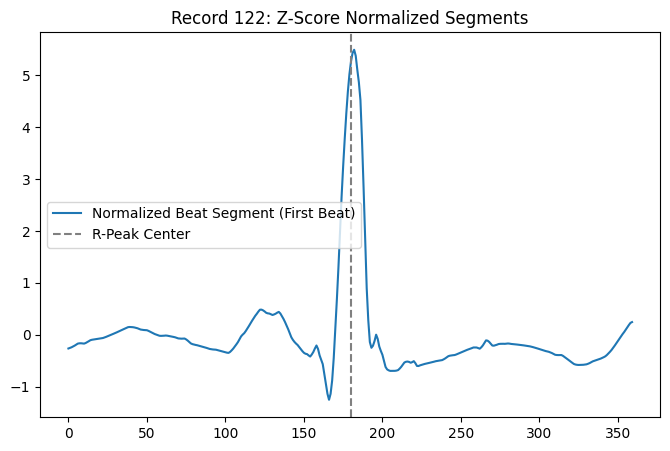


Processing Record: 123


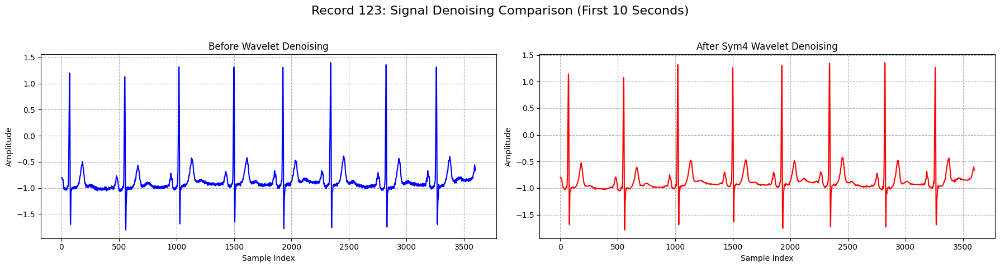


Record 123: Extracted 66 valid heartbeat segments.


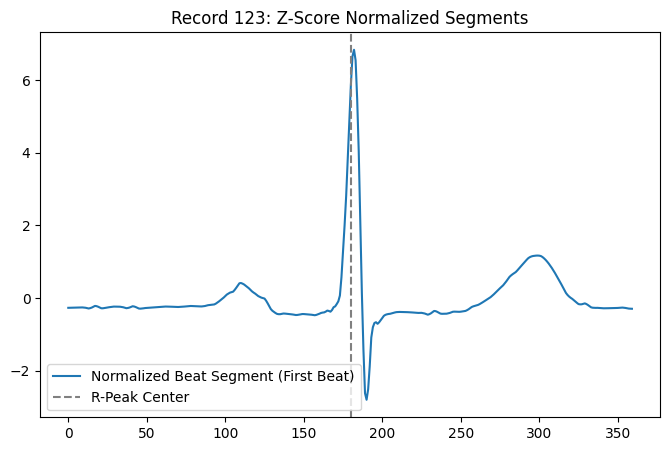


Processing Record: 124


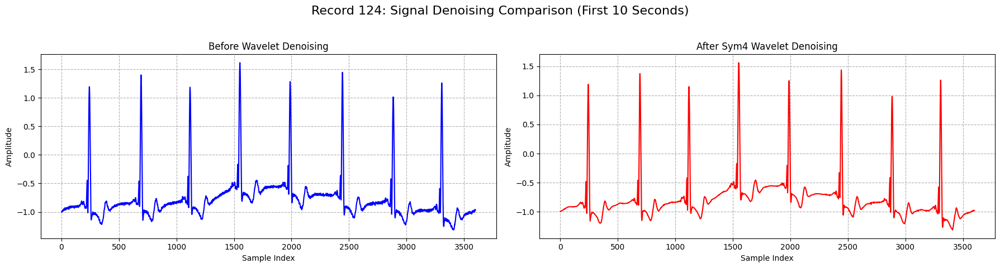


Record 124: Extracted 537 valid heartbeat segments.


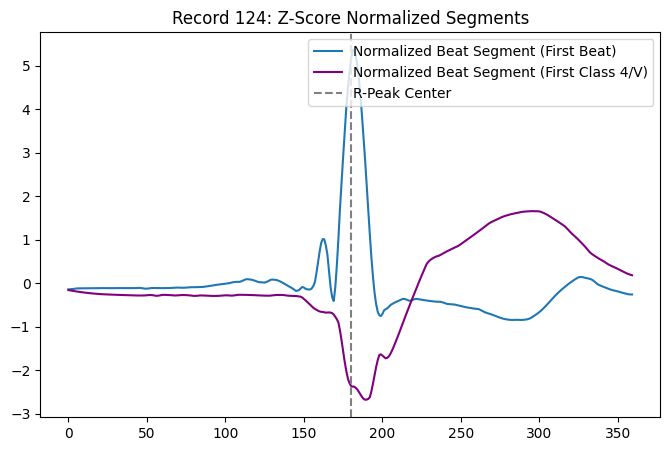


Processing Record: 200


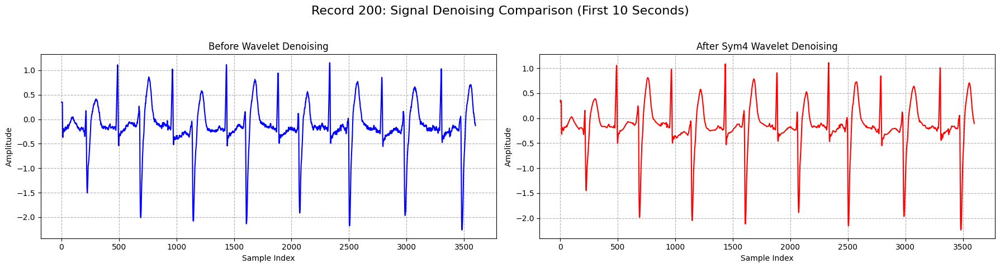


Record 200: Extracted 625 valid heartbeat segments.


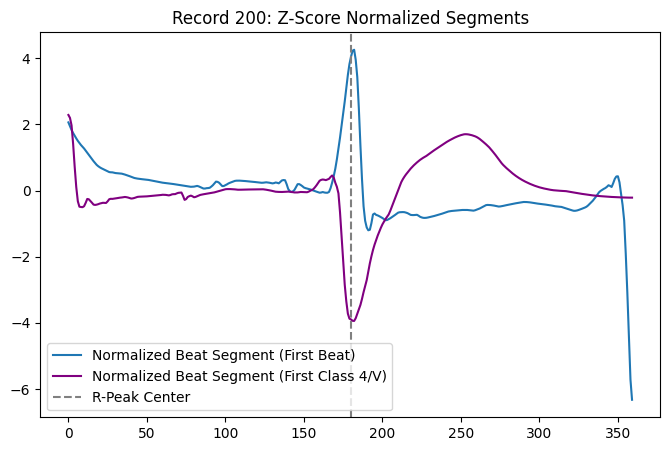


Processing Record: 201


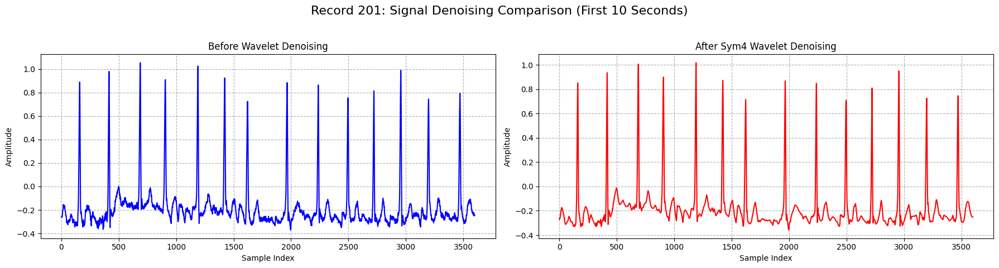


Record 201: Extracted 254 valid heartbeat segments.


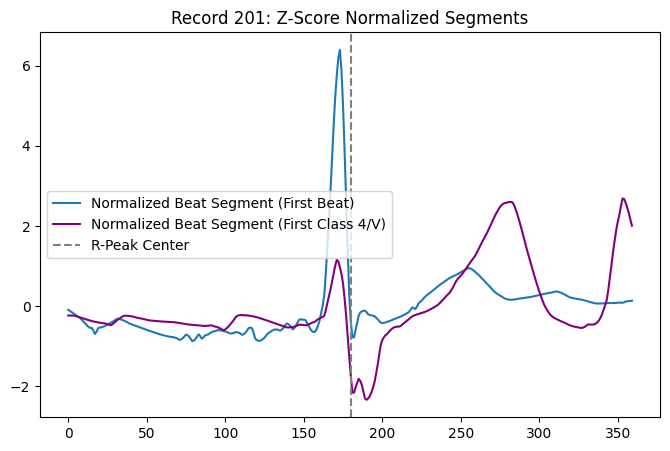


Processing Record: 202


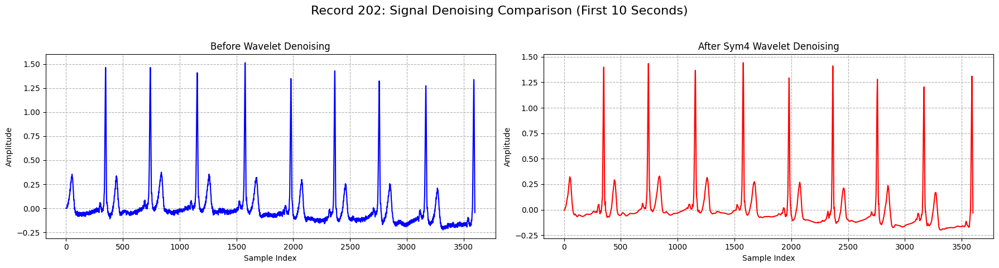


Record 202: Extracted 201 valid heartbeat segments.


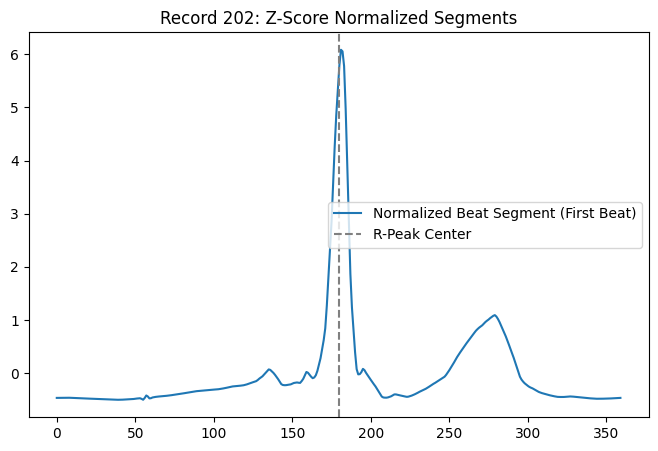


Processing Record: 203


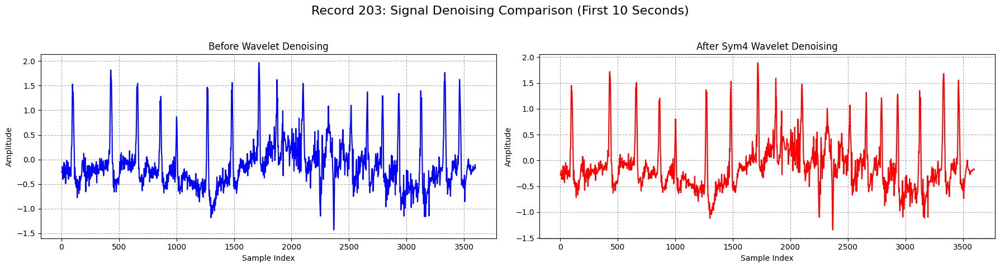


Record 203: Extracted 742 valid heartbeat segments.


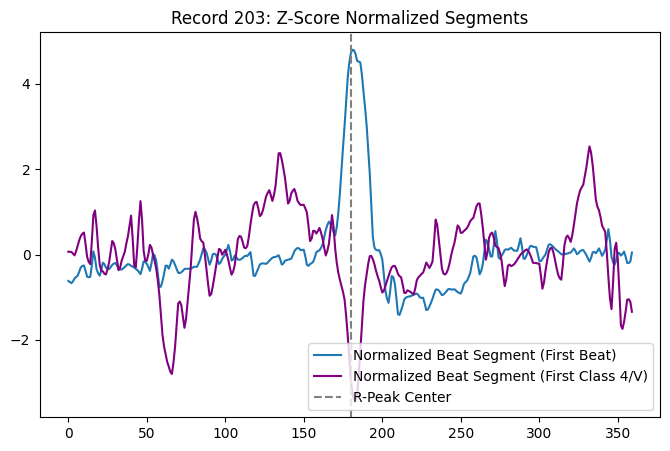


Processing Record: 205


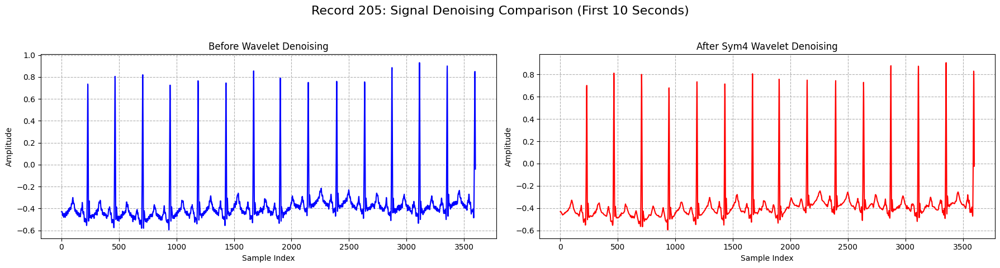


Record 205: Extracted 900 valid heartbeat segments.


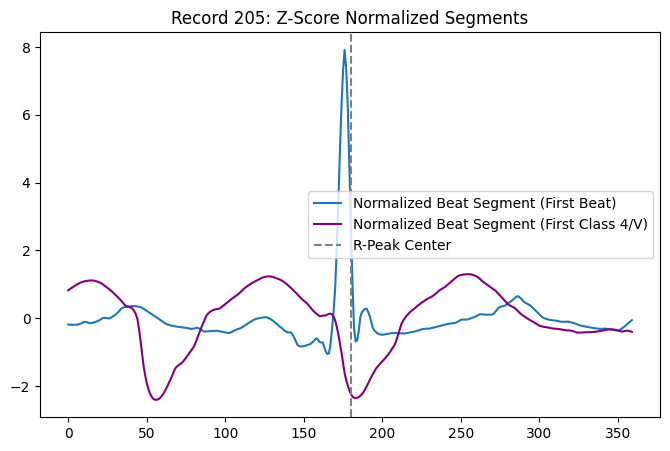


Processing Record: 207


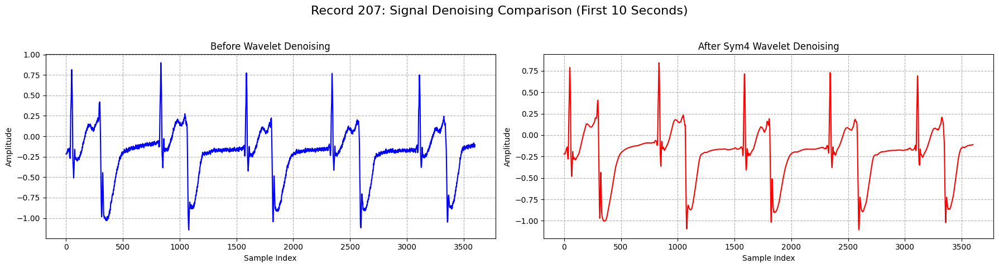


Record 207: Extracted 349 valid heartbeat segments.


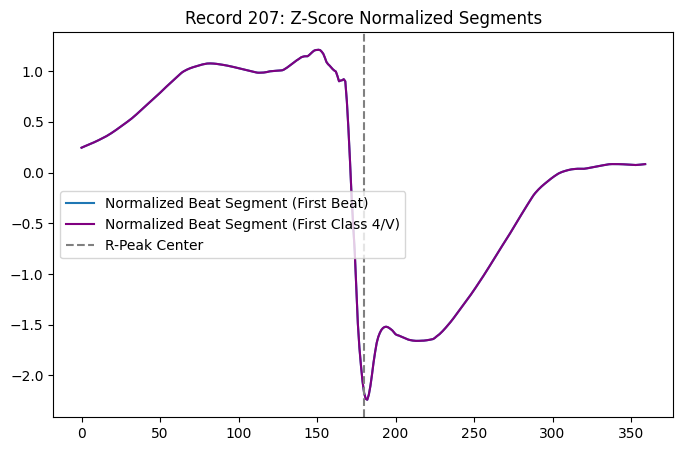


Processing Record: 208


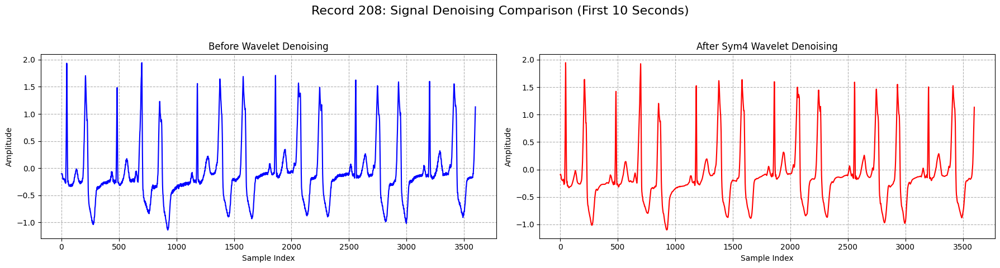


Record 208: Extracted 945 valid heartbeat segments.


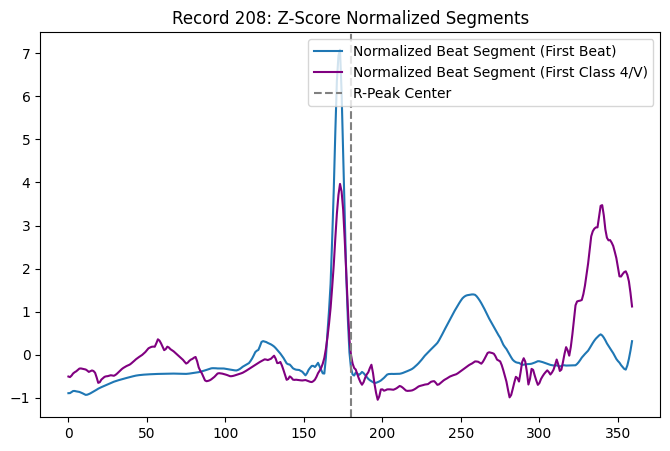


Processing Record: 209


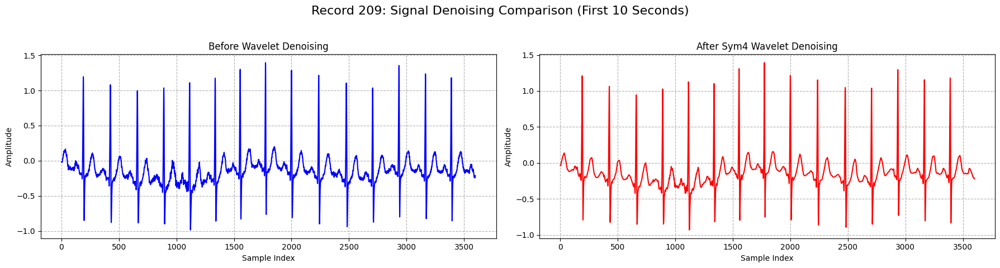


Record 209: Extracted 645 valid heartbeat segments.


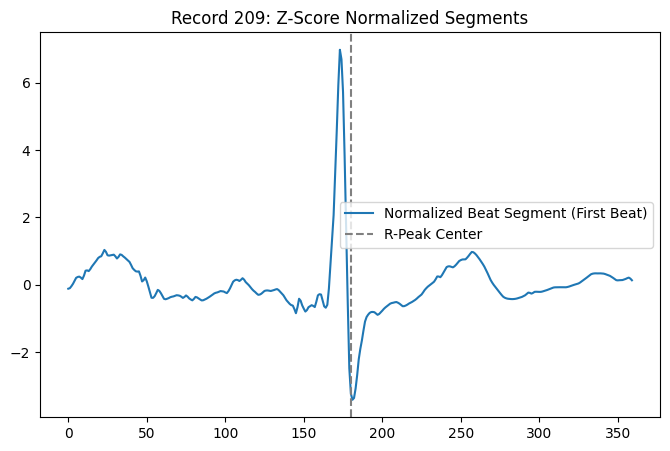


Processing Record: 210


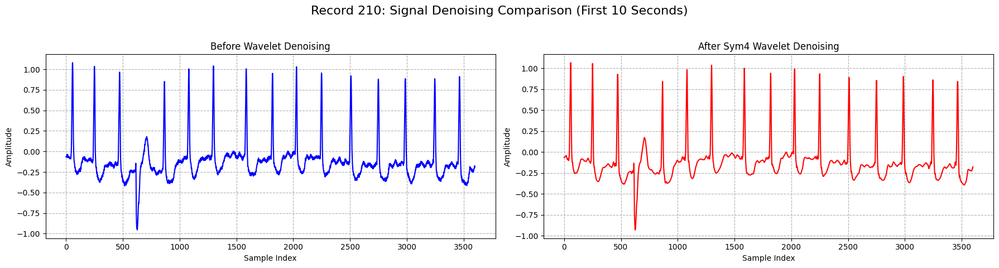


Record 210: Extracted 312 valid heartbeat segments.


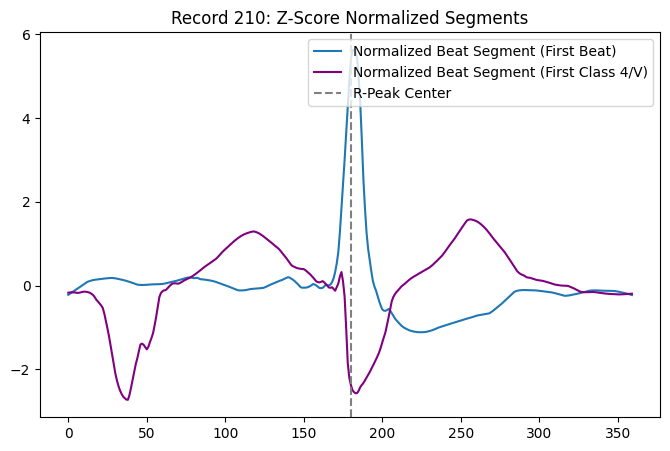


Processing Record: 212


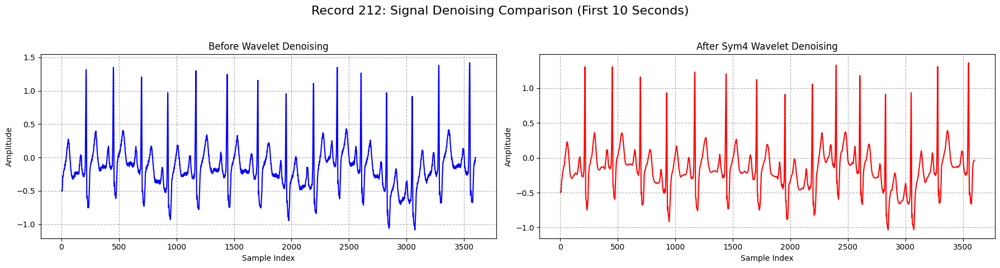


Record 212: Extracted 1853 valid heartbeat segments.


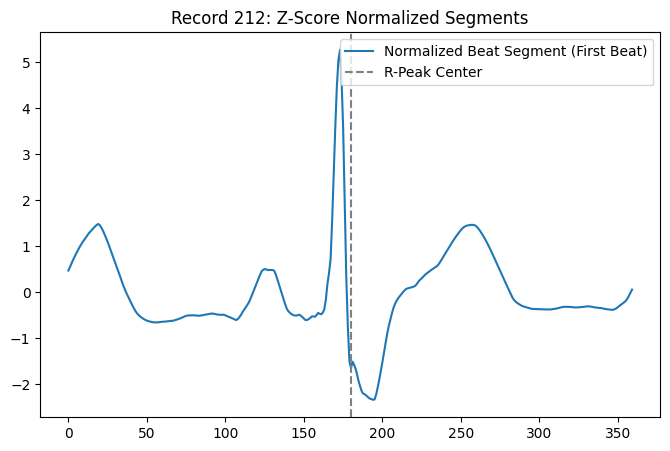


Processing Record: 213


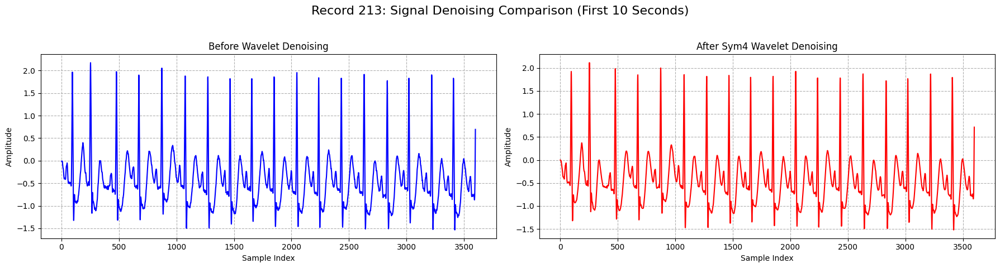


Record 213: Extracted 1326 valid heartbeat segments.


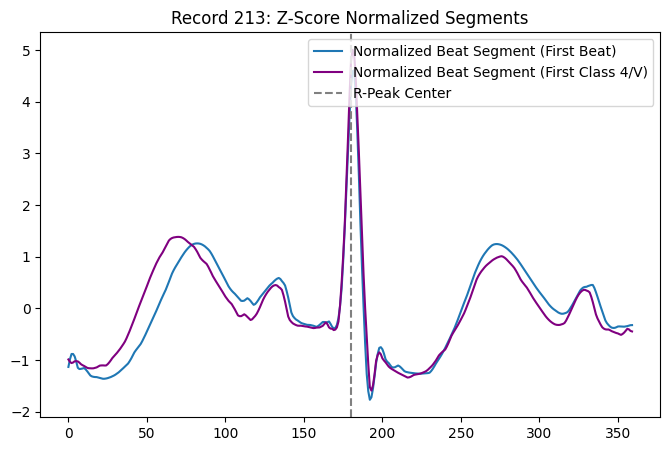


Processing Record: 214


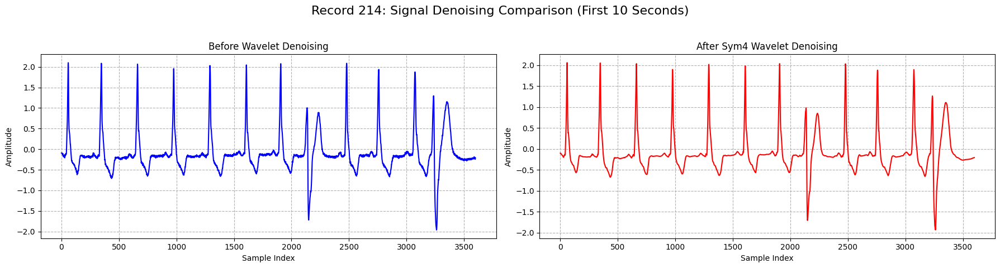


Record 214: Extracted 337 valid heartbeat segments.


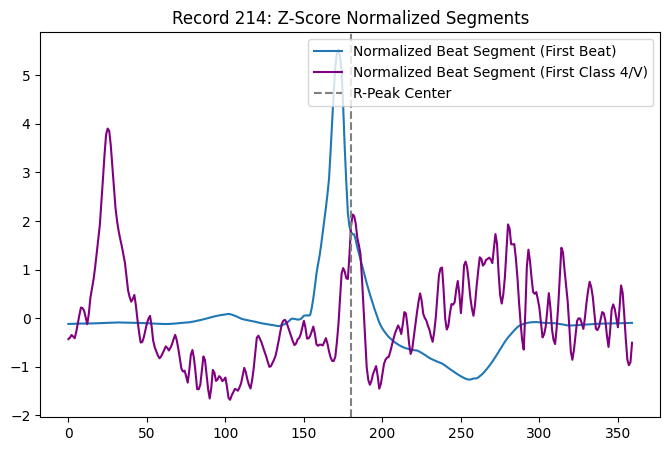


Processing Record: 215


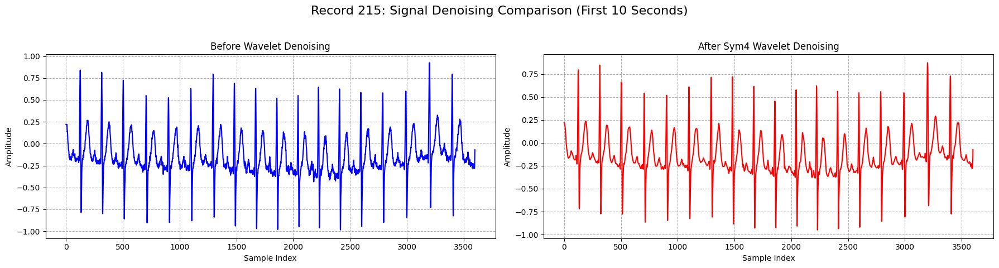


Record 215: Extracted 341 valid heartbeat segments.


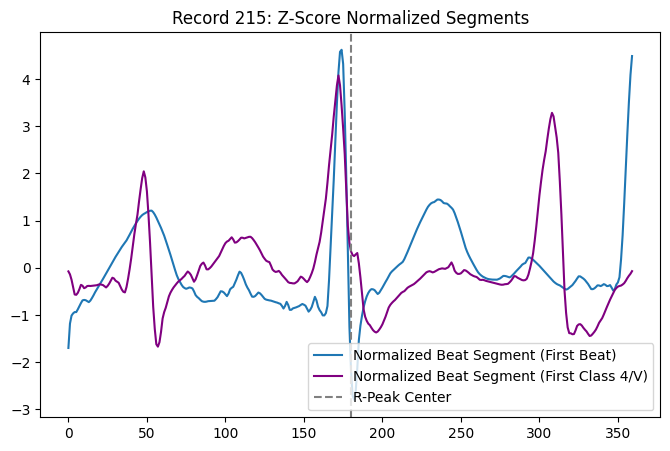


Processing Record: 217


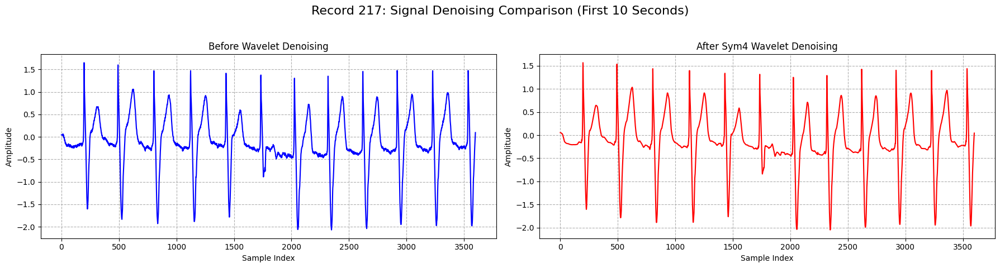


Record 217: Extracted 66 valid heartbeat segments.


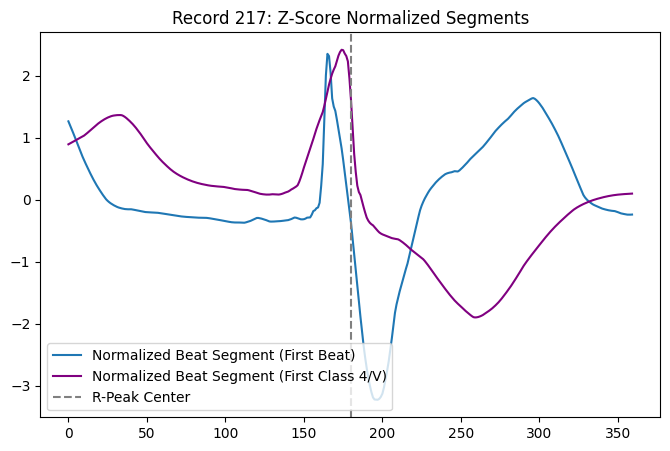


Processing Record: 219


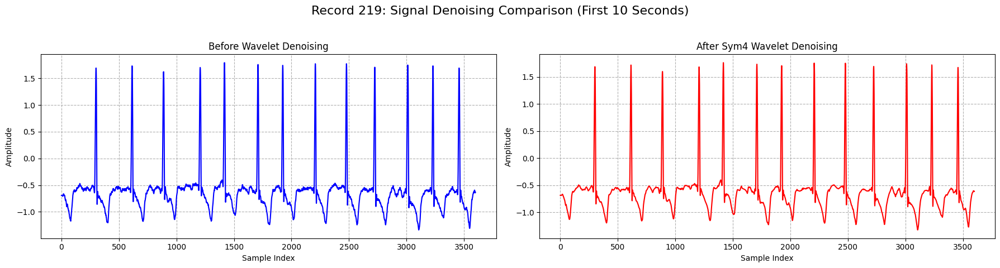


Record 219: Extracted 346 valid heartbeat segments.


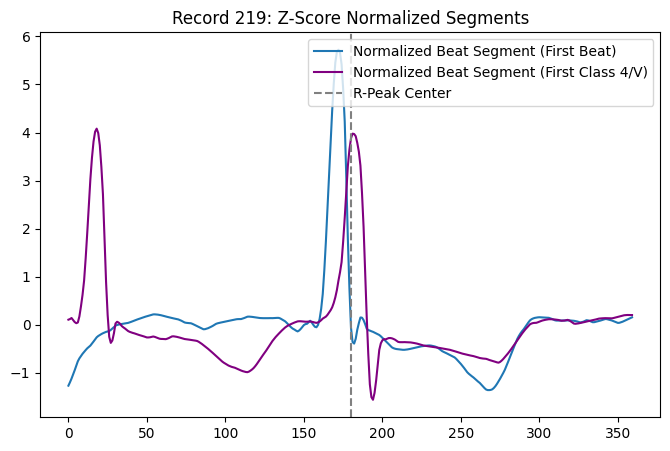


Processing Record: 220


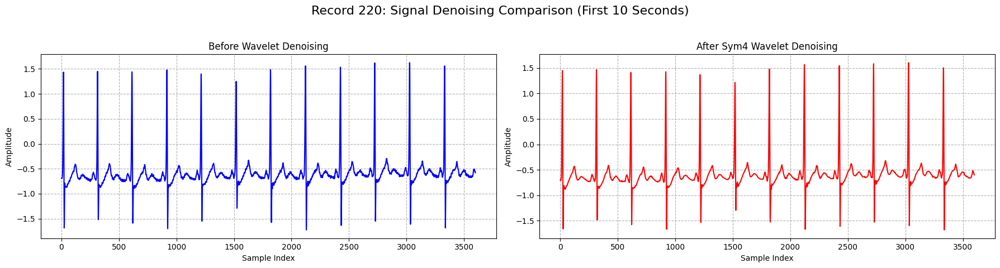


Record 220: Extracted 129 valid heartbeat segments.


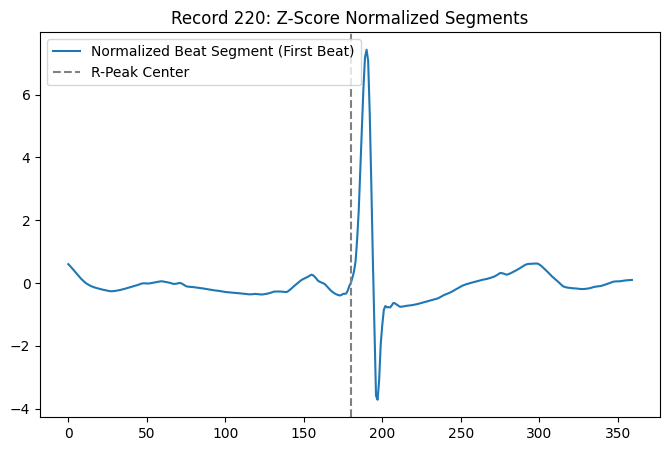


Processing Record: 221


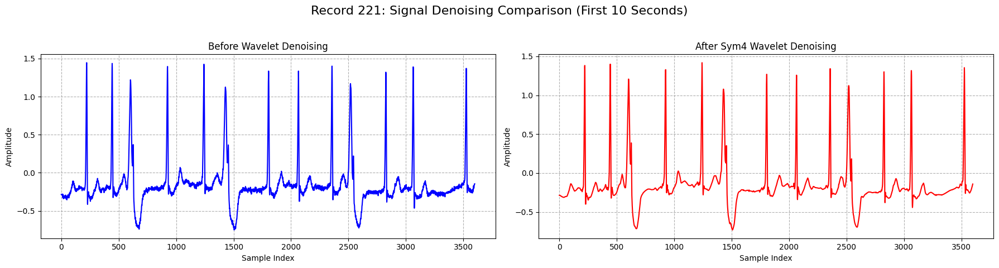


Record 221: Extracted 288 valid heartbeat segments.


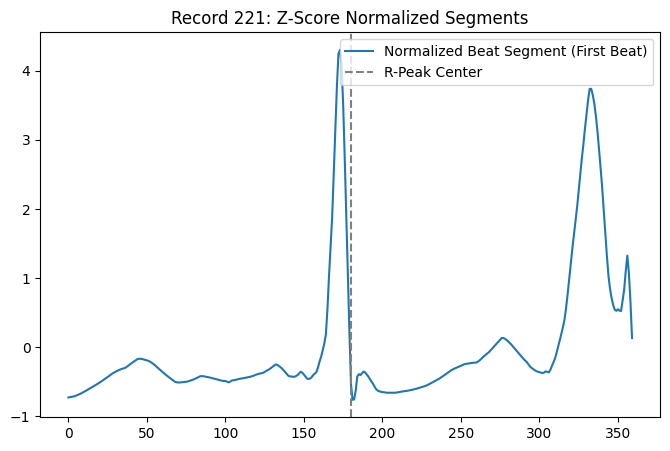


Processing Record: 222


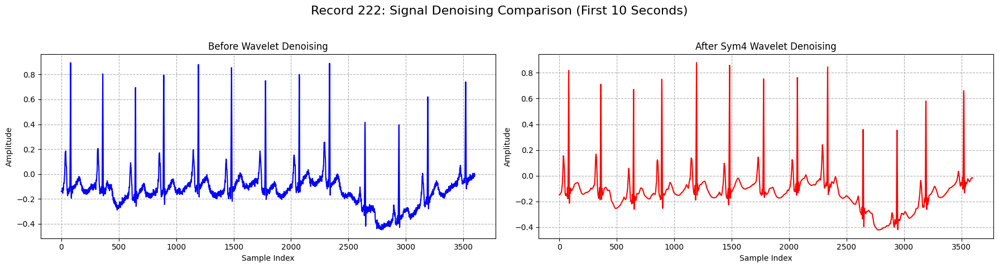


Record 222: Extracted 1649 valid heartbeat segments.


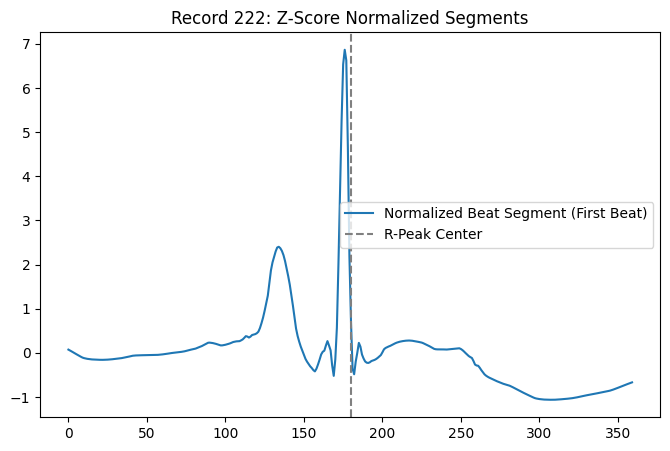


Processing Record: 223


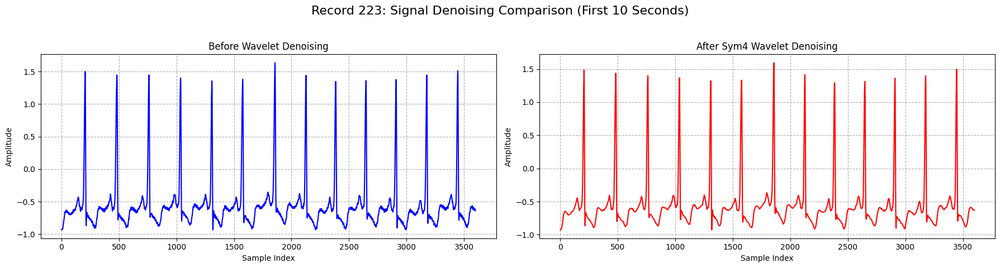


Record 223: Extracted 417 valid heartbeat segments.


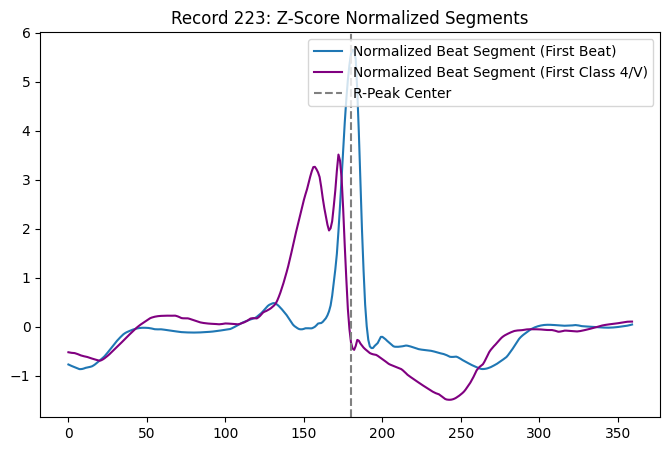


Processing Record: 228


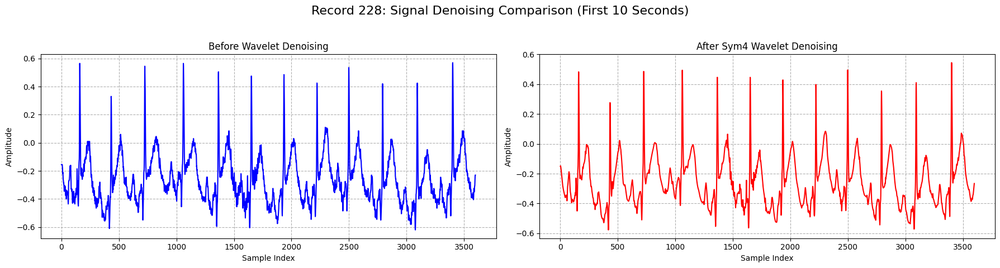


Record 228: Extracted 825 valid heartbeat segments.


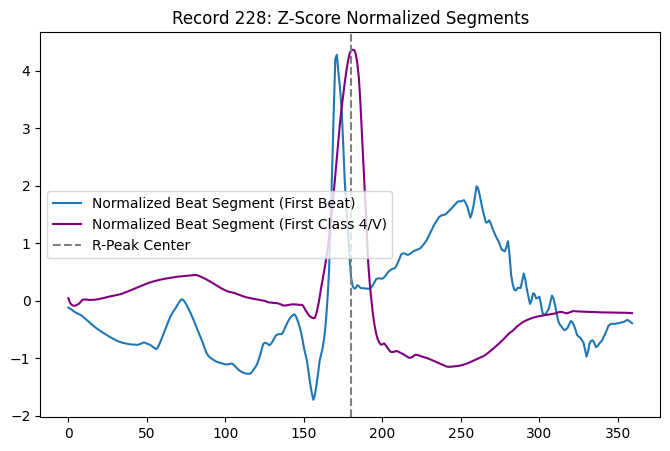


Processing Record: 230


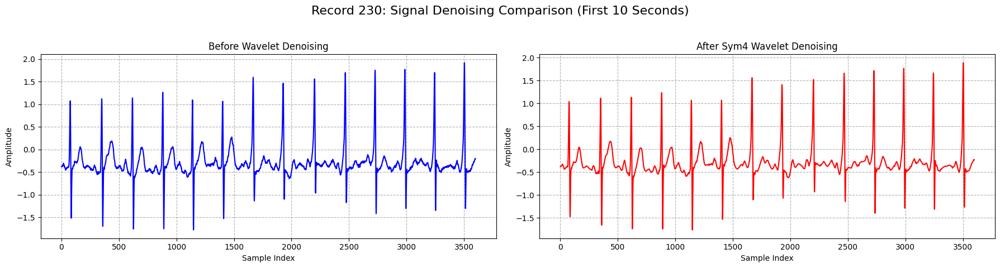


Record 230: Extracted 199 valid heartbeat segments.


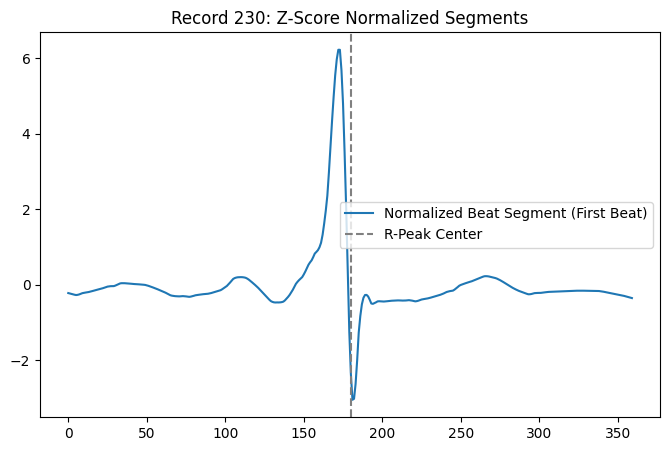


Processing Record: 231


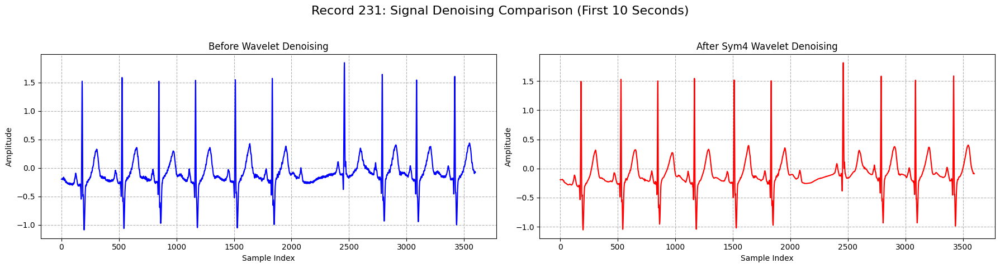


Record 231: Extracted 551 valid heartbeat segments.


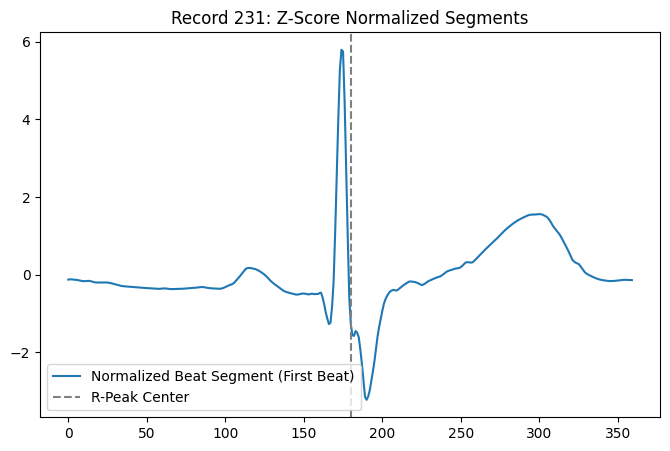


Processing Record: 232


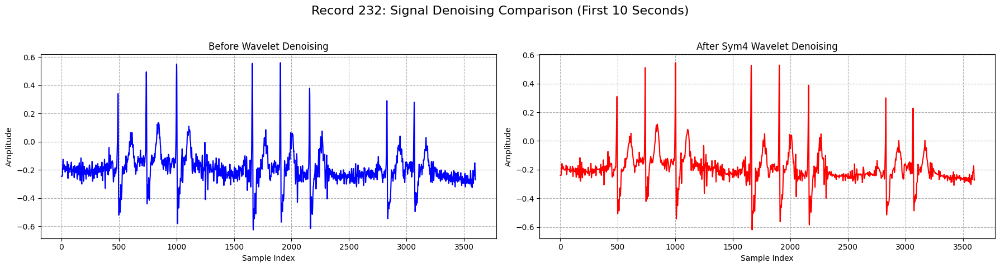


Record 232: Extracted 430 valid heartbeat segments.


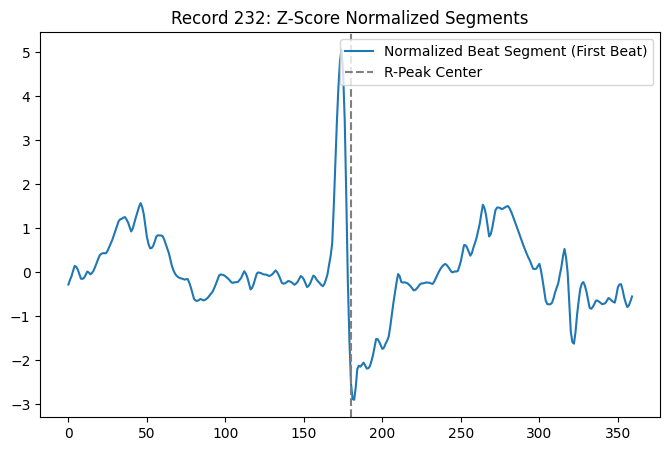


Processing Record: 233


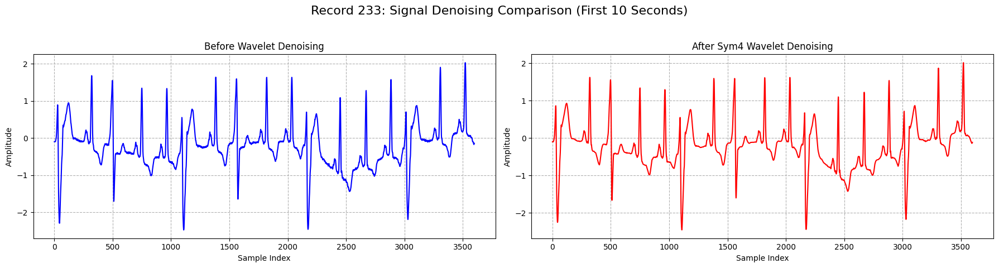


Record 233: Extracted 1153 valid heartbeat segments.


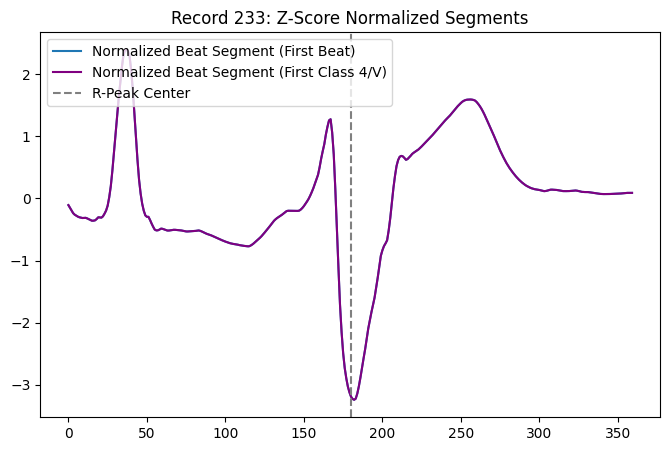


Processing Record: 234


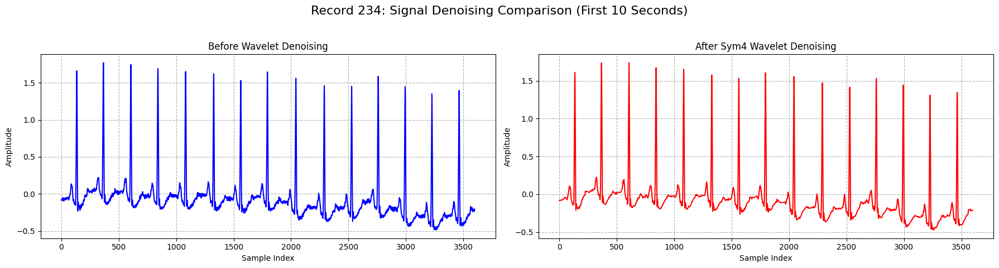


Record 234: Extracted 2280 valid heartbeat segments.


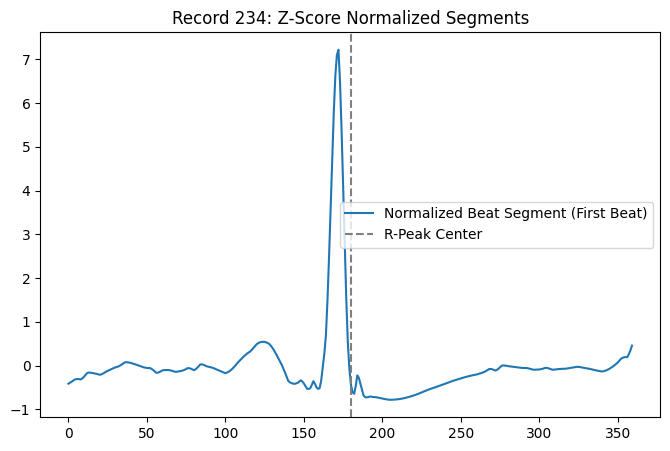


FINAL CONSOLIDATED DATASET
Total Heartbeat Samples: 29647
Final Label Distribution:
0    23916
1     1300
2     2433
3      485
4     1513
Name: count, dtype: int64


In [39]:
def consolidate_all_records(record_list):
    """Processes a list of record IDs and consolidates all segments and labels."""
    
    X_all, Y_all = [], []
    
    for record_id in record_list:
        print(f"\nProcessing Record: {record_id}")
        
        # 1. Denoise
        denoised_ekg = load_and_denoise_signal(record_id, ekg_records[record_id])
        if denoised_ekg is None:
            continue
            
        # 2. Detect R-peaks
        r_peaks = pan_tompkins_rpeak_detection(denoised_ekg)
        
        # 3. Segment, Normalize, and Label
        X_rec, Y_rec = segment_and_normalize_beats(denoised_ekg, r_peaks, record_id)
        
        if len(X_rec) > 0:
            X_all.append(X_rec)
            Y_all.append(Y_rec)

    if X_all:
        X_final = np.concatenate(X_all, axis=0)
        Y_final = np.concatenate(Y_all, axis=0)
        
        print("\n" + "="*50)
        print("FINAL CONSOLIDATED DATASET")
        print(f"Total Heartbeat Samples: {X_final.shape[0]}")
        print(f"Final Label Distribution:\n{pd.Series(Y_final).value_counts().sort_index()}")
        print("="*50)
        return X_final, Y_final
    else:
        print("No valid segments were extracted from the provided records.")
        return None, None

ALL_RECORD_IDS = list(ekg_records.keys())
X_final, Y_final = consolidate_all_records(ALL_RECORD_IDS)



In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, mean_squared_error
from imblearn.over_sampling import SMOTE
import numpy as np
import pandas as pd

SEQUENCE_LENGTH = 360  # input sequence size per beat (WINDOW_BEFORE_R + WINDOW_AFTER_R)
INPUT_SIZE = 1         # single feature (ECG voltage)
NUM_CLASSES = 5        # N, L, R, A, V
BATCH_SIZE = 64
KFOLD_SPLITS = 5
LEARNING_RATE = 1e-3
NUM_EPOCHS = 20        # Start with a moderate number
HIDDEN_SIZE = 64       # LSTM layer neuron count (from study)
DROPOUT_RATE = 0.3     # Dropout rate (from study)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class ECGDataset(Dataset):
    def __init__(self, X_data, y_data):
        self.X = torch.tensor(X_data, dtype=torch.float32).unsqueeze(-1) 
        self.y = torch.tensor(y_data, dtype=torch.long)

    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

class ECG_LSTM(nn.Module):

    def __init__(self, input_size, hidden_size, num_classes, dropout_rate):
        super(ECG_LSTM, self).__init__()
        
        self.lstm = nn.LSTM(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=1,      
            batch_first=True
        )
        
        self.fc1 = nn.Linear(hidden_size, 128)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.fc_out = nn.Linear(128, num_classes)

    def forward(self, x):
        out, (h_n, c_n) = self.lstm(x)
        out = out[:, -1, :] 
        
        out = self.fc1(out)
        out = self.relu(out)
        out = self.dropout(out)
        out = self.fc_out(out)
        
        return out

In [ ]:
if len(X_final.shape) == 3:
    X_final = X_final.squeeze(-1)

print(f"Total dataset samples: {X_final.shape[0]}")

X_train_val, X_test, y_train_val, y_test = train_test_split(
    X_final, Y_final, test_size=0.20, random_state=42, stratify=Y_final
)
print(f"Test Set reserved (20%): {X_test.shape[0]} samples.")
print(f"Training/Validation Pool (80%): {X_train_val.shape[0]} samples.")

kf = KFold(n_splits=KFOLD_SPLITS, shuffle=True, random_state=42)
all_fold_metrics = []
best_model_weights = None
best_accuracy = 0.0

Total dataset samples: 29647
Test Set reserved (20%): 5930 samples.
Training/Validation Pool (80%): 23717 samples.


In [ ]:
for fold, (train_index, val_index) in enumerate(kf.split(X_train_val, y_train_val)):
    print(f"\n{'='*20} Starting Fold {fold+1}/{KFOLD_SPLITS} {'='*20}")
    
    X_train_fold, X_val_fold = X_train_val[train_index], X_train_val[val_index]
    y_train_fold, y_val_fold = y_train_val[train_index], y_train_val[val_index]
    
    smote = SMOTE(random_state=42)
    X_train_sm, y_train_sm = smote.fit_resample(X_train_fold, y_train_fold)
    
    X_train_sm = X_train_sm.reshape(X_train_sm.shape[0], SEQUENCE_LENGTH, INPUT_SIZE)
    X_val_fold = X_val_fold.reshape(X_val_fold.shape[0], SEQUENCE_LENGTH, INPUT_SIZE)
    
    print(f"   SMOTE: Training samples increased to {X_train_sm.shape[0]}.")
    
    train_dataset = ECGDataset(X_train_sm.squeeze(), y_train_sm)
    val_dataset = ECGDataset(X_val_fold.squeeze(), y_val_fold)
    
    train_loader = DataLoader(dataset=train_dataset, batch_size=BATCH_SIZE, shuffle=True)
    val_loader = DataLoader(dataset=val_dataset, batch_size=BATCH_SIZE, shuffle=False)
    
    model = ECG_LSTM(INPUT_SIZE, HIDDEN_SIZE, NUM_CLASSES, DROPOUT_RATE).to(DEVICE)
    optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)
    criterion = nn.CrossEntropyLoss()
    
    for epoch in range(NUM_EPOCHS):
        model.train()
        total_epoch_loss = 0
        num_batches = len(train_loader)
    
        for i, (sequences, labels) in enumerate(train_loader):
            sequences, labels = sequences.to(DEVICE), labels.to(DEVICE)
            
            optimizer.zero_grad()
            outputs = model(sequences)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
        
            total_epoch_loss += loss.item()

        if (i + 1) % 50 == 0 or (i + 1) == num_batches:
            current_loss = loss.item()
            print(
                f"    -> Fold {fold+1}/{KFOLD_SPLITS}, "
                f"Epoch {epoch+1}/{NUM_EPOCHS} | Batch {i+1}/{num_batches} "
                f"| Current Loss: {current_loss:.4f}"
            )
            
    avg_epoch_loss = total_epoch_loss / num_batches
    print(
        f"    --- Epoch {epoch+1}/{NUM_EPOCHS} Complete. Average Training Loss: {avg_epoch_loss:.4f} ---"
    )

    model.eval()
    with torch.no_grad():
        val_predictions = []
        val_labels = []
        
        for sequences, labels in val_loader:
            sequences, labels = sequences.to(DEVICE), labels.to(DEVICE)
            outputs = model(sequences)
            _, predicted = torch.max(outputs.data, 1)
            
            val_predictions.extend(predicted.cpu().numpy())
            val_labels.extend(labels.cpu().numpy())

        fold_accuracy = accuracy_score(val_labels, val_predictions)
        all_fold_metrics.append(fold_accuracy)
        print(f"   Fold {fold+1} Validation Accuracy: {fold_accuracy * 100:.2f}%")
        
        if fold_accuracy > best_accuracy:
            best_accuracy = fold_accuracy
            best_model_weights = model.state_dict()
            print("   (New best model saved)")

print("\n" + "="*50)
print(f"K-Fold Cross-Validation Complete. Average Accuracy: {np.mean(all_fold_metrics) * 100:.2f}%")
print("="*50)


==================== Starting Fold 1/5 ====================
   SMOTE: Training samples increased to 76675.


KeyboardInterrupt: 

In [ ]:
final_model = ECG_LSTM(INPUT_SIZE, HIDDEN_SIZE, NUM_CLASSES, DROPOUT_RATE).to(DEVICE)
final_model.load_state_dict(best_model_weights)
final_model.eval()

X_test = X_test.reshape(X_test.shape[0], SEQUENCE_LENGTH, INPUT_SIZE)
test_dataset = ECGDataset(X_test.squeeze(), y_test)
test_loader = DataLoader(dataset=test_dataset, batch_size=BATCH_SIZE, shuffle=False)

test_predictions = []
test_labels = []
test_outputs_prob = []

with torch.no_grad():
    for sequences, labels in test_loader:
        sequences, labels = sequences.to(DEVICE), labels.to(DEVICE)
        outputs = final_model(sequences)
        _, predicted = torch.max(outputs.data, 1)
        
        test_predictions.extend(predicted.cpu().numpy())
        test_labels.extend(labels.cpu().numpy())
        
        probabilities = torch.softmax(outputs, dim=1)
        test_outputs_prob.extend(probabilities.cpu().numpy())

target_names = ['N (0)', 'L (1)', 'R (2)', 'A (3)', 'V (4)']

print("\n" + "="*20 + " FINAL TEST SET CLASSIFICATION REPORT " + "="*20)
print(classification_report(test_labels, test_predictions, target_names=target_names, digits=4))

cm = confusion_matrix(test_labels, test_predictions)
print("\nConfusion Matrix:")
print(cm)



y_true_one_hot = np.eye(NUM_CLASSES)[test_labels]
rmse = np.sqrt(mean_squared_error(y_true_one_hot.flatten(), np.array(test_outputs_prob).flatten()))

print(f"\nRoot Mean Square Error (RMSE): {rmse:.4f}")